In [1]:
import matplotlib.pyplot as pp
import matplotlib as mp
import pandas as pd
from copy import deepcopy
import numpy as np
from pathlib import Path
import plotting as plots
import warnings
warnings.filterwarnings('ignore')

# Setup

## Color maps

In [2]:
cmap_perc = "Blues"
cmap_abs_fluxes = plots.CMAPS['green']
pairwise = plots.CMAPS['rdbu_paired']
cmap_shift = 'coolwarm'
cmap_flux = plots.CMAPS['purple_pink']

## Setting path to data and path to export images to

In [3]:
mitocore_path = Path('../external_data/mitocore/')
datapath = Path("../results")
assert datapath.exists()
figpath = Path(f"../images/parp")
figpath.mkdir(exist_ok=True)
supplement_path = Path("../images/supplements/")
supplement_path.mkdir(exist_ok=True)

## Loading results

In [4]:
tags_mito = [
    '293 + high NAD', 
    'mitoparp + high NAD', 
    '293 + low NAD', 
    'mitoparp + low NAD',
]

tags_nad = [
    '293 + high NAD', 
    'mitoparp + high NAD',
    '293 + low NAD', 
    'mitoparp + low NAD',
]

tags_all = [
    '293', 
    'mitoparp', 
    '293 + high NAD', 
    'mitoparp + high NAD',
    '293 + low NAD', 
    'mitoparp + low NAD',
]

In [5]:
print_labels = [
    'HEK293 high NAD',
    '293mitoPARP high NAD',
    'HEK293 low NAD',
    '293mitoPARP low NAD',
]

In [6]:
df_fl = pd.read_csv(datapath / 'fluxes_pfba.csv', index_col = 0)
df_upper_bounds = pd.read_csv(datapath / 'upper_bounds.csv', index_col = 0)
df_lower_bounds = pd.read_csv(datapath / 'lower_bounds.csv', index_col = 0)

## Joining and dropping pathways

In [7]:
sum_paths = True
summation = {
    'Reductive carboxylation': 'Reductive carboxylation / Acetyl-CoA production for biosynthesis',
    'Glycolysis': 'Glycolysis/gluconeogenesis',
    'FA metabolism': 'FA and ketone body metabolism / Ketogenesis',
    'Ketone bodies - degradation': 'FA and ketone body metabolism / Ketogenesis',
    'Glutamate degradation/synthesis - cytosolic': 'Glutamate degradation/synthesis',
    'GABA shunt - transport': 'GABA shunt',
    'TCA cycle periphery': 'TCA cycle',
    'Ketogenesis / Leucine degradation': 'Leucine degradation',
}
if sum_paths:
    for from_path, to_path in summation.items():
        df_fl.loc[(df_fl.subsystem == from_path), 'subsystem'] = to_path    

In [8]:
all_subsystems = list(df_fl['subsystem'].unique())
drop_subsystems = [
       'subsystem',
       'Boundary conditions - core',
       'Mitochondrial transport - diffusion / artificial',
       'Boundary Conditions - Misc',
       'Cytosolic misc',
       'Boundary Conditions - Biomarkers',
       'Boundary conditions - nonessential amino acids',
]
keep_subsystems = [s for s in all_subsystems if s not in drop_subsystems]

# Analysis

In [9]:
def shorten_path(name: str, char: str, split_after: int = 15):
    # we want the most even split between the two lines of text created
    if not isinstance(name, str):
        print(f'Casting {type(name)} {name} to string ')
        name = str(name)
    if len(name) < split_after * 1.5:
        return name
    splits = name.split(char)
    best_diff = 1_000_000
    best = ''
    for i in range(len(splits)):
        first = char.join(splits[:i])
        second = char.join(splits[i:])
        curr_diff = abs(len(first) - len(second))
        if curr_diff <= best_diff:
            best_diff = curr_diff
            best = '\n'.join([first, second])
    return best


## Reactions

### Number of reactions

In [10]:
for model in tags_mito:
    print(model)
    n_zeros = np.sum(np.isclose(df_fl[model], 0.))
    print(n_zeros)
    print('---')

293 + high NAD
289
---
mitoparp + high NAD
294
---
293 + low NAD
265
---
mitoparp + low NAD
233
---


### Top changed reactions

In [11]:
df_fl_top = deepcopy(df_fl.loc[:, tags_mito])
df_fl_top['sort'] = df_fl_top.loc[:, tags_mito].std(axis=1)
df_fl_top = df_fl_top.sort_values('sort', ascending=False).head(20)

In [12]:
fluxes = [
    'H2Otm',
    'PIt2mB_MitoCore',
    'Biomass_MitoCore',
    'OF_ATP_MitoCore',
    'ATPtmB_MitoCore',
    'CV_MitoCore',
    'CIII_MitoCore',
    'CI_MitoCore',
    'O2tm',
    'CIV_MitoCore',
    'O2t',
    'CO2tm',
    'CO2t',
    'H2Ot',
    'MDHm',
    'AKGDm',
    'SUCOASm',
    'FUMm',
    'CII_MitoCore',
    'ACONTm',
]

fluxes_desc = [
    '$H_2O$ c -> m',
    'Phosphate $H^+$ symport c -> m',
    'Biomass sink',
    'ATP objective',
    'ADP/ATP antiport m <-> c',
    'ATP synthase', #C5 ETC
    'Cytochrome c reductase', #C3 ETC
    'NADH dehydrogenase', #C1 ETC
    '$O_2$ diffusion c -> m',
    'Cytochrome c oxidase', #C4 ETC
    '$O_2$ diffusion e -> c',
    '$CO_2$ diffusion c -> m',
    '$CO_2$ diffusion e -> c',
    '$H_2O$ diffusion e -> c',
    'Malate dehydrogenase 2 (NAD) (m)', #TCA
    '2-oxoglutarate dehydrogenase', #TCA
    'Succinate-CoA ligase (ADP)', 
    'Fumarate hydratase', #TCA
    'Succinate dehydrogenase', #C2 ETC
    'Aconitate hydratase', #TCA
]

mapping = dict(zip(fluxes, fluxes_desc))

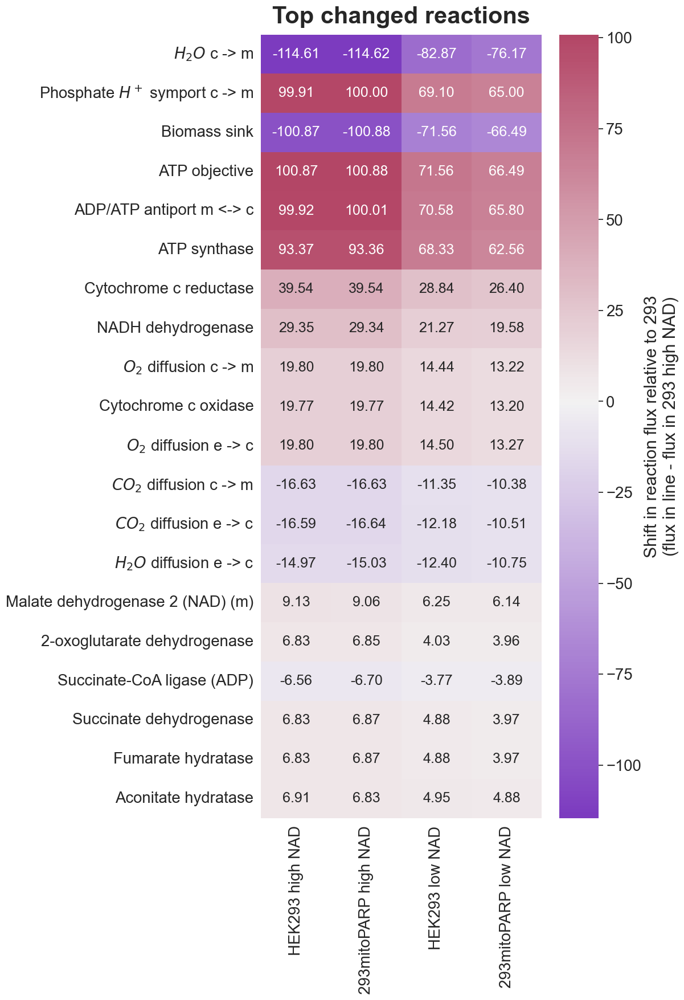

In [13]:
fig, ax = plots.basic_heatmap(
    df_fl_top.loc[:, tags_mito],
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(12,18),
    cmap=cmap_flux,
    xrotation = 90,
    yrotation=0,
    cbarlabel = 'Shift in reaction flux relative to 293\n(flux in line - flux in 293 high NAD)',
    font_scale = 1.8,
    labels = print_labels,
)
ax.set_yticklabels(df_fl_top.index.map(lambda x: mapping.get(x,x)))
ax.set_title(
    'Top changed reactions', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

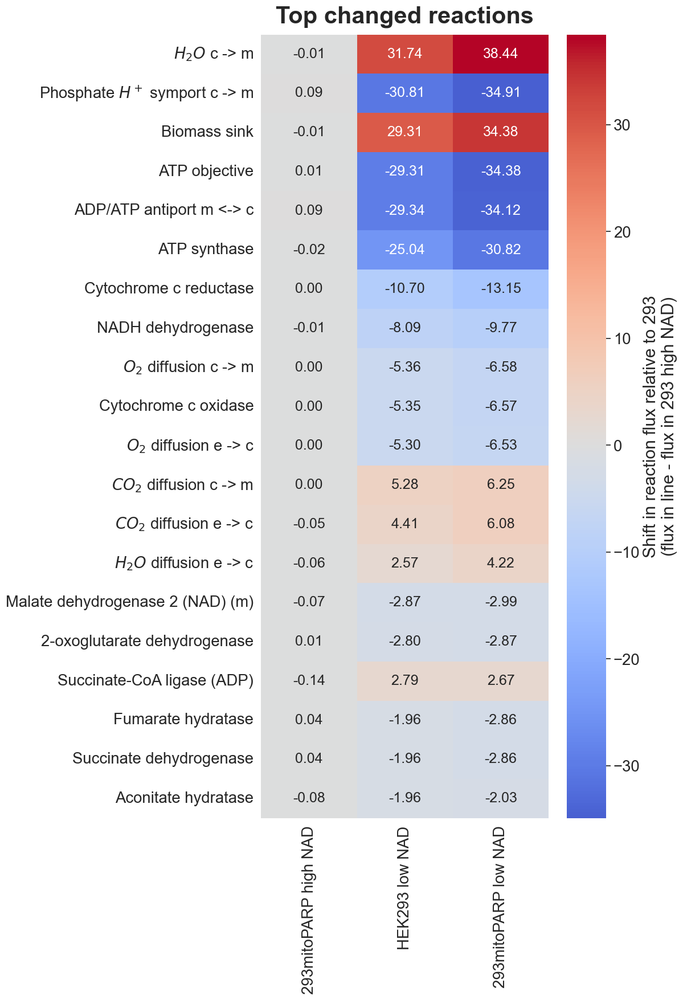

In [14]:
df_fl_top_rel = deepcopy(df_fl_top.loc[:, tags_mito])
for c in df_fl_top_rel.columns[::-1]:
    df_fl_top_rel.loc[:, c] = df_fl_top_rel.loc[:, c] - df_fl_top_rel.loc[:, '293 + high NAD']
    
df_fl_top_rel = df_fl_top_rel.iloc[:, 1:].loc[fluxes, :]
    
fig, ax = plots.basic_heatmap(
    df_fl_top_rel,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(12,18),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = 'Shift in reaction flux relative to 293\n(flux in line - flux in 293 high NAD)',
    font_scale = 1.8,
    labels = print_labels[1:],
)
ax.set_yticklabels(df_fl_top_rel.index.map(lambda x: mapping.get(x,x)))
ax.set_title(
    'Top changed reactions', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

### Flux boundaries: All NAD-dependent

In [15]:
with open('../external_data/mitocore/nad_rxns.txt', 'r') as f:
    nad_rxns = [x.strip() for x in f.readlines()]
    nad_rxns = [x for x in nad_rxns if x in df_upper_bounds.index]

In [16]:
nad_upper = df_upper_bounds.loc[nad_rxns].sort_values('subsystem').loc[:, tags_all]
nad_lower = df_lower_bounds.loc[nad_rxns].sort_values('subsystem').loc[:, tags_all]

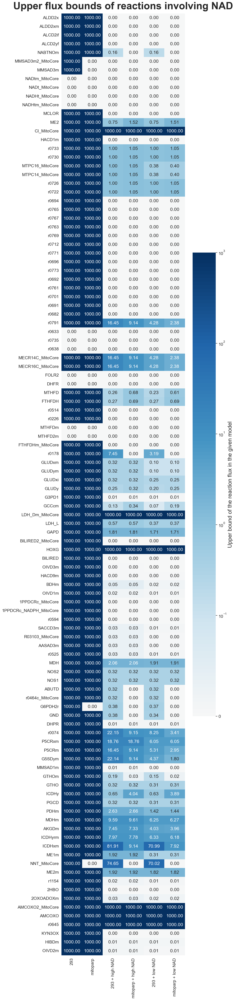

In [17]:
fig, ax = plots.basic_heatmap(
    nad_upper,
    size=(12,50),
    xrotation = 90,
    yrotation = 0,
    annot_kws = {'fontsize': 'medium'},
    font_scale = 1.4,
    norm = mp.colors.SymLogNorm(
        vmin=0., vmax=1000.,
        linthresh=.1,
    ),
)
fs=20
ax.collections[0].colorbar.set_label('Upper bound of the reaction flux in the given model', fontsize=fs)
ax.set_title('Upper flux bounds of reactions involving NAD', fontdict={'fontsize':36, 'fontweight':'bold'}, pad=15)
pp.tight_layout()

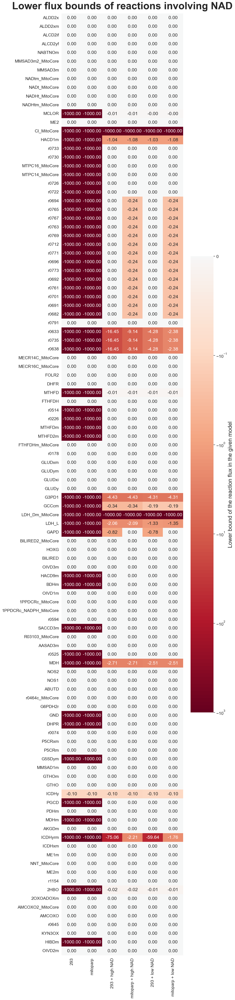

In [18]:
fig, ax = plots.basic_heatmap(
    nad_lower,
    size=(12,50),
    xrotation = 90,
    yrotation = 0,
    annot_kws = {'fontsize': 'medium'},
    font_scale = 1.4,
    norm = mp.colors.SymLogNorm(
        vmin=-1000., vmax=0.,
        linthresh=.1,
    ),
)
ax.collections[0].colorbar.set_label('Lower bound of the reaction flux in the given model', fontsize=fs)
ax.set_title('Lower flux bounds of reactions involving NAD', fontdict={'fontsize':36, 'fontweight':'bold'}, pad=15)
pp.tight_layout()

## Subsystems

In [19]:
# Present pathways:
df_fl.subsystem.unique()

array(['Lysine degradation (L-pipecolate pathway)',
       'Threonine and Methionine degradation',
       'Boundary Conditions - Biomarkers',
       'Tryptophan / Lysine Metabolism ', 'Tyrosine degradation',
       'Valine degradation', 'Cysteine degradation I', 'GABA shunt',
       'Arginine degradation', 'Haem Synthesis', 'Glycine degradation',
       'Lysine degradation (saccharopine pathway)',
       'Ornithine degradation (cytosolic)', 'Isoleucine degradation',
       'FA and ketone body metabolism / Ketogenesis',
       'Boundary conditions - core',
       'Mitochondrial transporters - characterised', 'Alcohol metabolism',
       'FA synthesis - cytosolic', 'Propanoate metabolism',
       'Reductive carboxylation / Acetyl-CoA production for biosynthesis',
       'TCA cycle', 'Acetate production',
       'Fatty acid elongation in mitochondria', 'Cytosolic misc',
       'Methionine degradation', 'Purine Nucleotide Cycle',
       'Malate aspartate shuttle',
       'Boundary conditio

### complete

In [20]:
cutoff = .01
epsilon = 10 ** -3

df_path = deepcopy(df_fl.loc[:, tags_mito + ['subsystem']])
df_path.loc[:, tags_mito] = df_path.loc[:, tags_mito].abs()
df_path = df_path.groupby('subsystem').mean().loc[keep_subsystems, :]
df_path = df_path[df_path.mean(axis=1) > cutoff]
df_path.fillna(epsilon, inplace=True)
df_path['sort'] = df_path.std(axis=1)
top20 = df_path.sort_values('sort', ascending=False).loc[:, tags_mito].head(20)

In [21]:
paths = [
    'Objective Function - ATP ',
    'Electron transport chain',
    'Mitochondrial transporters - characterised',
    'TCA cycle',
    'GABA shunt',
    'Malate aspartate shuttle',
    'Glycolysis/gluconeogenesis',
    'FA and ketone body metabolism / Ketogenesis',
    'Reductive carboxylation / Acetyl-CoA production for biosynthesis',
    'Carnitine shuttle',
    'Serine and glycine biosynthesis',
    'Glycine cleavage system (GCS)',
    'Folate cytosolic',
    'Mitochondrial transporters - uncharacterised',
    'Tryptophan / Lysine Metabolism ',
    'Glutamate degradation/synthesis',
    'Lysine degradation (saccharopine pathway)',
    'Leucine degradation',
    'ROS defense',
    'Proline / ornithine degradation',
]
pretty_paths = [
    'Objective Function - ATP ',
    'Electron transport chain',
    'Mitochondrial transporters -\ncharacterised',
    'TCA cycle',
    'GABA shunt',
    'Malate aspartate\nshuttle',
    'Glycolysis /\ngluconeogenesis',
    'Fatty acid and\nketone body metabolism',
    'Reductive carboxylation',
    'Carnitine shuttle',
    'Serine and glycine\nbiosynthesis',
    'Glycine cleavage system',
    'Folate cytosolic',
    'Mitochondrial transporters -\nuncharacterised',
    'Tryptophan / Lysine\nmetabolism ',
    'Glutamate\ndegradation / synthesis',
    'Lysine degradation',
    'Ketogenesis /\nLeucine degradation',
    'ROS defense',
    'Proline / ornithine degradation',
]
pretty_paths = dict(zip(paths, pretty_paths))

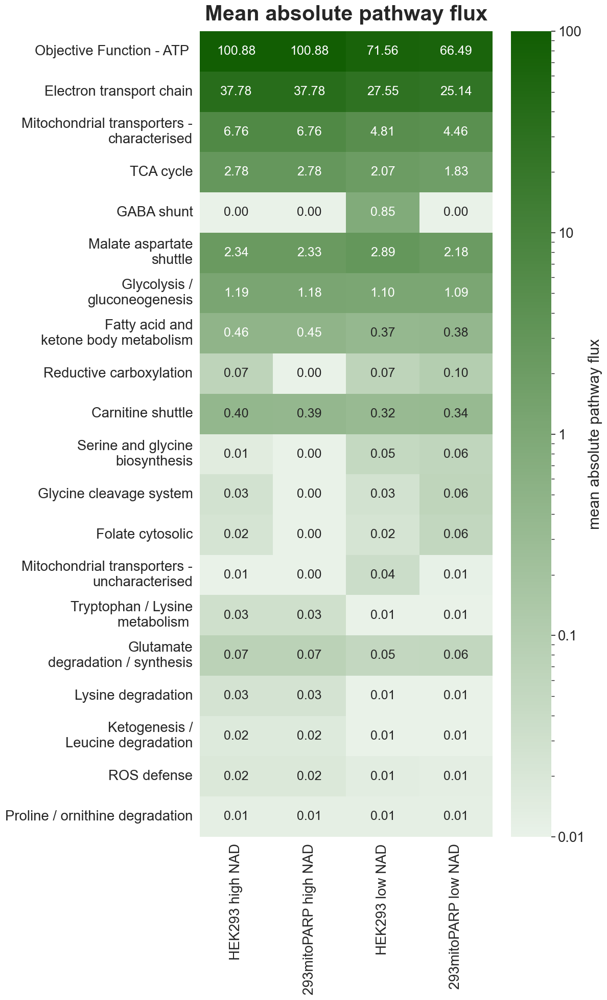

In [22]:
fig, ax = plots.basic_heatmap(
    top20 + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(12,20),
    center=50.,
    norm = mp.colors.LogNorm(
        vmin = 10 ** -2,
        vmax = 10 ** 2,
    ),
    xrotation = 90,
    yrotation=0,
    cmap = cmap_abs_fluxes,
    cbarlabel = 'mean absolute pathway flux',
    font_scale = 1.8,
    labels = print_labels,
)
ax.set_ylabel('')
ylabels = top20.index.map(lambda s: pretty_paths.get(s, f'MISSING\n{s})'))
cbar_ticks = ['0.001', '0.01', '0.1', '1', '10', '100', '1000']
ax.set_yticklabels(ylabels)
ax.set_title('Mean absolute pathway flux', fontdict={'fontsize':30, 'fontweight':'bold'}, pad=15)
ax.collections[0].colorbar.set_ticklabels(cbar_ticks)
pp.tight_layout()

In [23]:
def calculate_perc_change(df_ori, std_cutoff=0.0, abs_vals=True):
    eps = 10**-7
    df = deepcopy(df_ori)
    df = df[df.std(axis=1) >= std_cutoff]
    for i in range(len(df.columns)):
        x_p = df_ori.iloc[:, i]
        x = df_ori.iloc[:, 0]
        df.iloc[:, i] = (x_p - x) / (x + eps)
    if abs_vals:
        change = abs(df.iloc[:, 1:].dropna() * 100.0)
    else:
        change = df.iloc[:, 1:].dropna() * 100.0
    change[(change) > 1000.0] = 1000.0
    change[(change) < -1000.0] = -1000.0
    return change


transform = calculate_perc_change

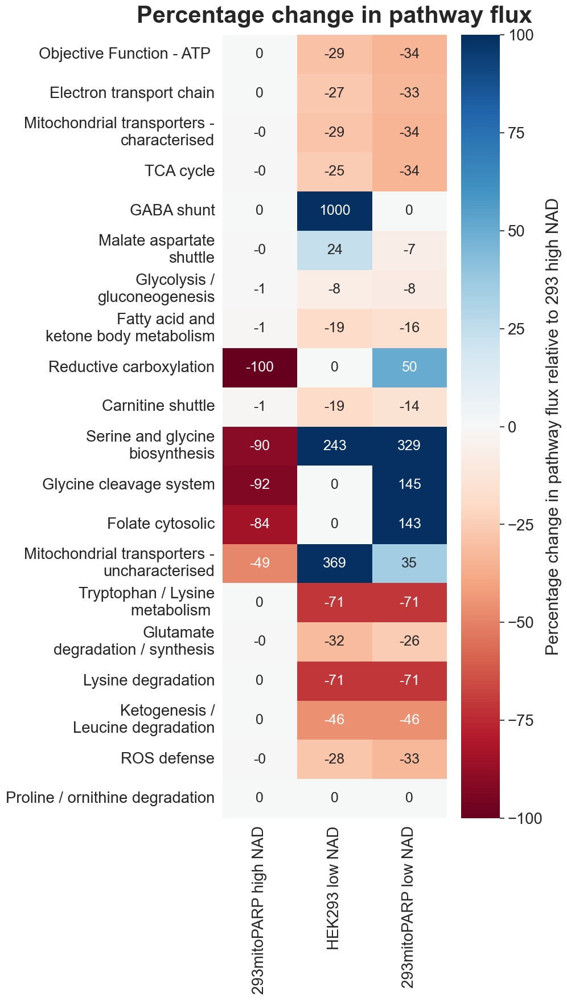

In [24]:
top20_rel = transform(top20, abs_vals=False)
limit = 100.0

fig, ax = plots.basic_heatmap(
    top20_rel,
    annot=True,
    annot_kws={"fontsize": "small"},
    size=(10, 18),
    cmap='RdBu',
    norm=mp.colors.TwoSlopeNorm(
        vmin=-100.0,
        vcenter=.0,
        vmax=100.0,
    ),
    center=450.0,
    xrotation=90,
    yrotation=0,
    cbarlabel="Percentage change in pathway flux relative to 293 high NAD",
    font_scale=1.8,
    labels=print_labels[1:],
    fmt=".0f",
)

ylabels = top20_rel.index.map(lambda s: pretty_paths.get(s, " "))
ax.set_yticklabels(ylabels)
ax.set_ylabel("")
ax.set_title(
    "Percentage change in pathway flux",
    fontdict={"fontsize": 30, "fontweight": "bold"},
    pad=15,
)
pp.tight_layout()

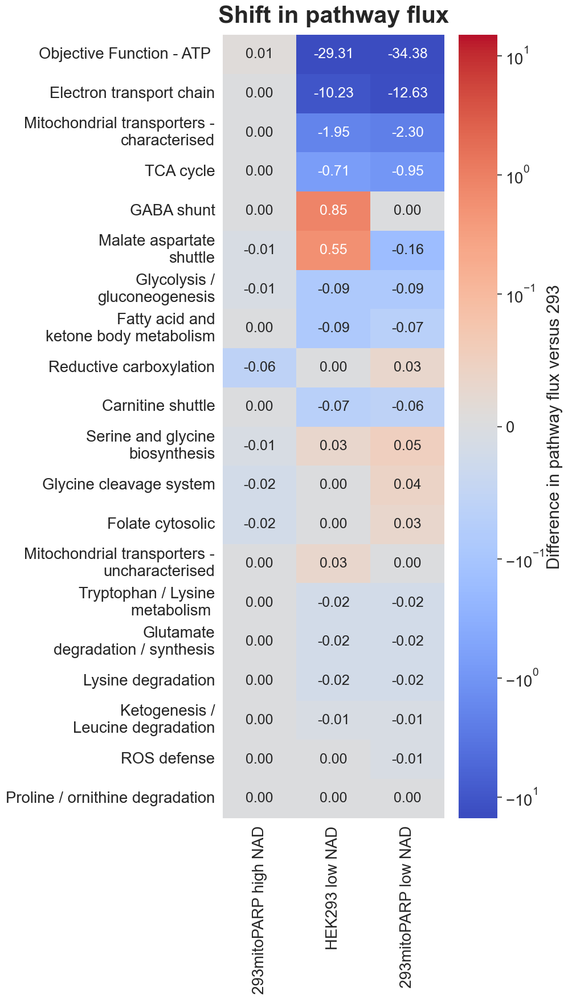

In [25]:
top20_shift = deepcopy(top20)
for i, col in enumerate(top20_shift.columns):
    top20_shift.iloc[:, i] = (top20.iloc[:, i] - top20.iloc[:, 0])
top20_shift = top20_shift.iloc[:,1:].dropna()
limit = 15.

fig, ax = plots.basic_heatmap(
    top20_shift.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(10,18),
    cmap=cmap_shift,
    norm = mp.colors.SymLogNorm(
        vmin=-limit, vmax=limit,
        linthresh=.1,
    ),
    xrotation = 90,
    yrotation = 0,
    cbarlabel = 'Difference in pathway flux versus 293',
    font_scale = 1.8,
    labels = print_labels[1:],
    center=-16.5,
)
cbar_ticks = [10, 1, 0.1, 0.01]
ylabels = top20_shift.index.map(lambda s: pretty_paths.get(s, ' '))
ax.set_yticklabels(ylabels)
ax.set_ylabel('')
ax.set_title(
    'Shift in pathway flux', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

### selected

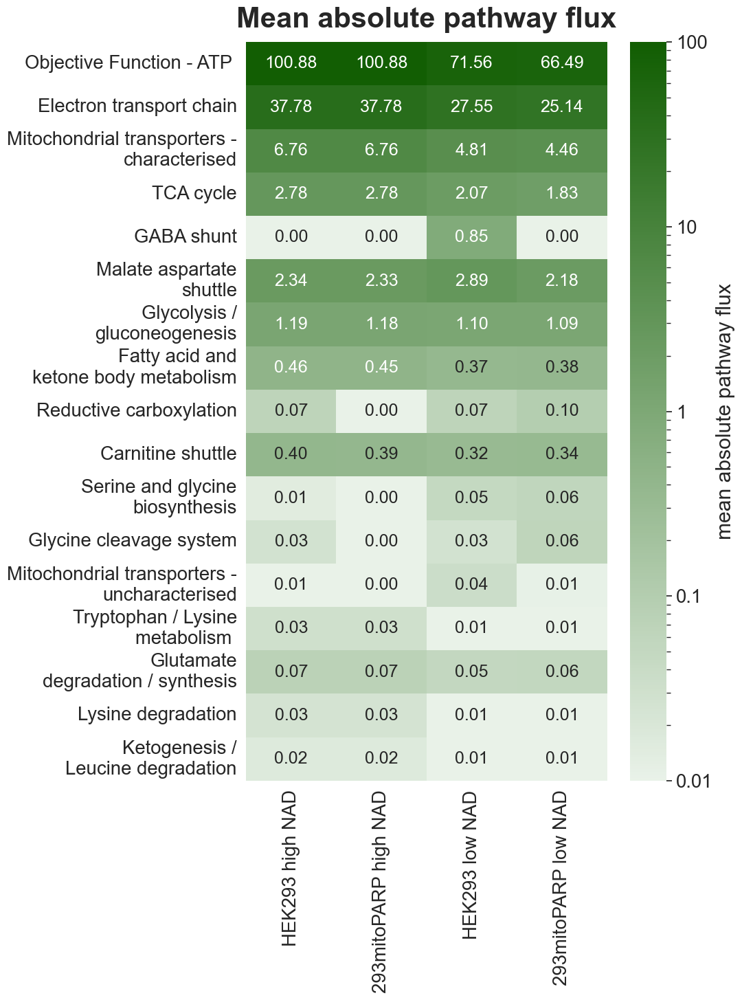

In [26]:
sel = [
    "Objective Function - ATP ",
    "Electron transport chain",
    "Mitochondrial transporters - characterised",
    "TCA cycle",
    "GABA shunt",
    "Malate aspartate shuttle",
    "Glycolysis/gluconeogenesis",
    "FA and ketone body metabolism / Ketogenesis",
    "Reductive carboxylation / Acetyl-CoA production for biosynthesis",
    "Carnitine shuttle",
    "Serine and glycine biosynthesis",
    "Glycine cleavage system (GCS)",
    #'Folate cytosolic',
    "Mitochondrial transporters - uncharacterised",
    "Tryptophan / Lysine Metabolism ",
    "Glutamate degradation/synthesis",
    "Lysine degradation (saccharopine pathway)",
    "Leucine degradation",
    #'ROS defense',
    #'Proline / ornithine degradation',
]

top20_abs_sel = top20.loc[sel, :]
fig, ax = plots.basic_heatmap(
    top20_abs_sel + epsilon,
    annot=True,
    annot_kws={"fontsize": "small"},
    size=(11, 15),
    center=50.0,
    norm=mp.colors.LogNorm(
        vmin=10**-2,
        vmax=10**2,
    ),
    xrotation=90,
    yrotation=0,
    cmap=cmap_abs_fluxes,
    cbarlabel="mean absolute pathway flux",
    font_scale=1.8,
    labels=print_labels,
)
ax.set_ylabel("")
ylabels = top20_abs_sel.index.map(lambda s: pretty_paths.get(s, f"MISSING\n{s})"))
cbar_ticks = ["0.001", "0.01", "0.1", "1", "10", "100", "1000"]
ax.set_yticklabels(ylabels)
ax.set_title(
    "Mean absolute pathway flux",
    fontdict={"fontsize": 30, "fontweight": "bold"},
    pad=15,
)
ax.collections[0].colorbar.set_ticklabels(cbar_ticks)
pp.tight_layout()


fig.savefig(
    figpath / "figure_s1.svg", transparent=True, bbox_inches="tight"
)

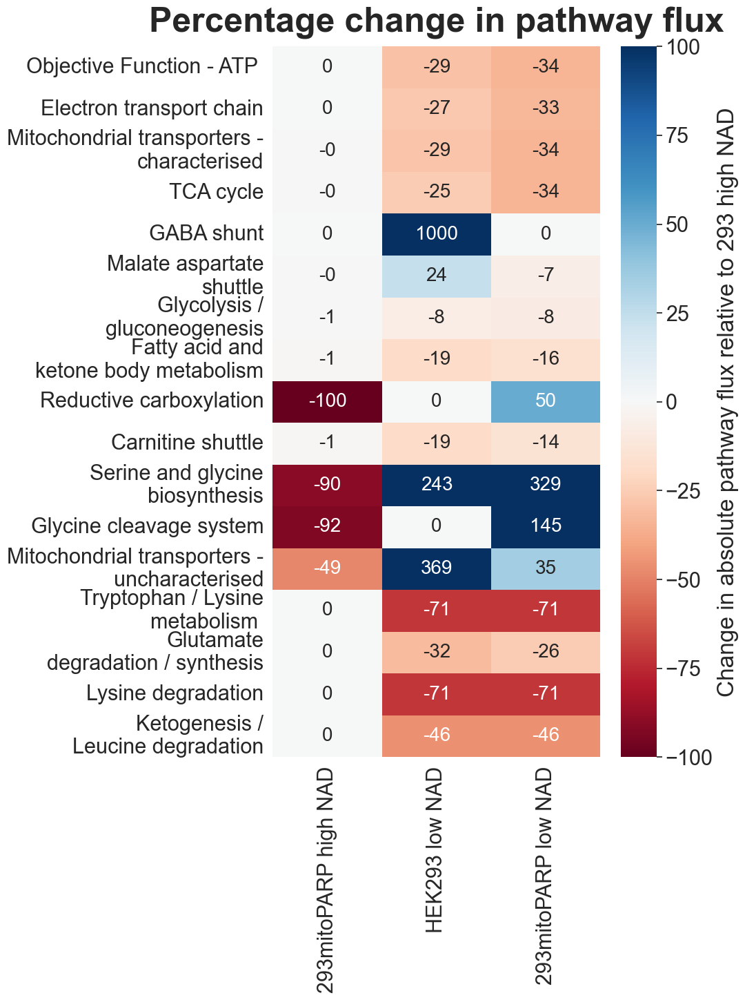

In [27]:
sel = [
    'Objective Function - ATP ',
    'Electron transport chain',
    'Mitochondrial transporters - characterised',
    'TCA cycle',
    'GABA shunt',
    'Malate aspartate shuttle',
    'Glycolysis/gluconeogenesis',
    'FA and ketone body metabolism / Ketogenesis',
    'Reductive carboxylation / Acetyl-CoA production for biosynthesis',
    'Carnitine shuttle',
    'Serine and glycine biosynthesis',
    'Glycine cleavage system (GCS)',
    #'Folate cytosolic',
    'Mitochondrial transporters - uncharacterised',
    'Tryptophan / Lysine Metabolism ',
    'Glutamate degradation/synthesis',
    'Lysine degradation (saccharopine pathway)',
    'Leucine degradation',
    #'ROS defense',
    #'Proline / ornithine degradation',
]

top20_rel_sel = top20_rel.loc[sel, :]
fig, ax = plots.basic_heatmap(
    top20_rel_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(11,15),
    cmap='RdBu',
    norm = mp.colors.Normalize(
        vmin=-100., 
        vmax=100.,
    ),
    xrotation = 90,
    yrotation = 0,
    cbarlabel = 'Change in absolute pathway flux relative to 293 high NAD',
    font_scale = 2.,
    labels = print_labels[1:],
    fmt ='.0f',
    center = 450.
)
cbar_ticks = [10, 1, 0.1, 0.01]
ylabels = top20_rel_sel.index.map(lambda s: pretty_paths.get(s, ' '))
ax.set_yticklabels(ylabels)
ax.set_ylabel('')
ax.set_title(
     'Percentage change in pathway flux', 
     fontdict={'fontsize':36, 'fontweight':'bold'}, 
     pad=15
)
pp.tight_layout()
fig.savefig(
    figpath / "pathways_top_select_rel.svg", transparent=True, bbox_inches="tight"
)

# Closer looks at some affected pathways

In [28]:
rxn_path = figpath / 'rxns_per_path'
rxn_path.mkdir(exist_ok=True)

In [29]:
rxn_data = pd.read_csv(mitocore_path / 'rxns_machine_readable.csv', index_col='id')
rxn_data.index = rxn_data.index.map(lambda s: s[2:])
rxn_names = dict(rxn_data['name'])
rxn_desc = dict(rxn_data['Description'])
gene_names = dict(rxn_data['Gene Name'])
gene_symbols = dict(rxn_data['Gene symbol'])
compartments = pd.read_csv(mitocore_path / 'rxn_compartments.csv', header=0, index_col=0)

In [30]:
def format_paths(path: pd.Index):
    return path\
        .map(lambda s: gene_names.get(s, ''))\
        .map(lambda s: shorten_path(s, ' '))\
        .map(lambda s: s.capitalize())

In [31]:
cbarlabel_rel = '\nPercentage change\nin reaction flux\nrelative to 293'
cbarlabel_abs = '\nReaction flux'

def get_norm(df):
    vmax = min(100, df.max().max())
    return mp.colors.Normalize(
        vmin = 0., vmax = vmax
    )

shared_y = 10

## TCA cycle

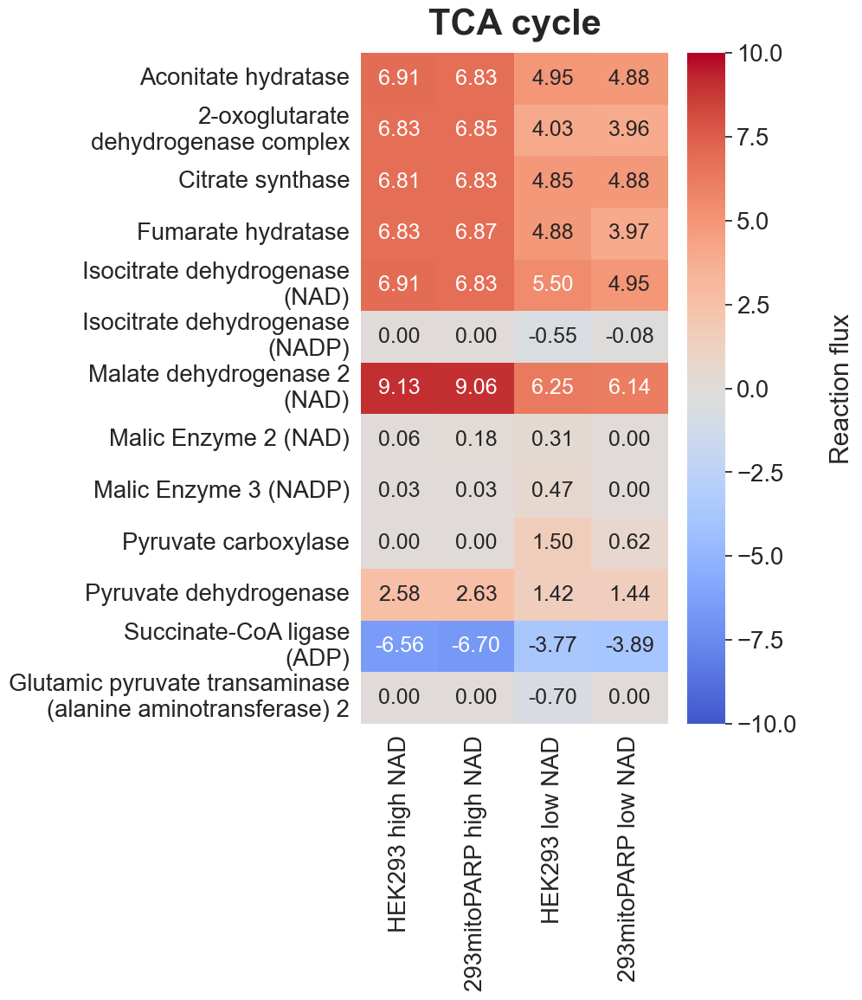

In [32]:
mapping = {
    'ACONTm': 'Aconitate hydratase',
    'AKGDm': '2-oxoglutarate\ndehydrogenase complex',
    'CSm': 'Citrate synthase',
    'FUMm': 'Fumarate hydratase',
    'ICDHxm': 'Isocitrate dehydrogenase\n(NAD)',
    'ICDHyrm': 'Isocitrate dehydrogenase\n(NADP)',
    'MDHm': 'Malate dehydrogenase 2\n(NAD)',
    'PDHm': 'Pyruvate dehydrogenase',
    'SUCOAS1m': 'Succinate-CoA ligase\n(GDP)',
    'SUCOASm': 'Succinate-CoA ligase\n(ADP)',
    # periphery
    'ME1m': 'Malic Enzyme 2 (NAD)',
    'ME2m': 'Malic Enzyme 3 (NADP)',
    'PCm': 'Pyruvate carboxylase',
    'r0081': 'Glutamic pyruvate transaminase\n(alanine aminotransferase) 2'
 }

df_sel = df_fl.loc[df_fl.subsystem.str.lower().str.endswith('tca cycle'), tags_mito]
df_sel = df_sel[df_sel.std(axis=1) > .1]

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = mp.colors.Normalize(
        vmin=-limit, vmax=limit,
    ),
    center = 1.,
    size=(shared_y,12),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels,
    cbar_kws = {'aspect': 17.5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'TCA cycle', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()
fig.savefig(rxn_path / 'tca_cycle_abs.svg', bbox_inches='tight')

In [33]:
df_fl.loc[df_fl.subsystem.str.lower().str.endswith("tca cycle"), tags_mito]

,293 + high NAD,mitoparp + high NAD,293 + low NAD,mitoparp + low NAD
ACITLm_MitoCore,0.000000,0.000000,0.000000,0.000000
ACONTm,6.907435,6.825391,4.950974,4.877782
ADK1m,0.000000,0.000000,0.006000,0.006000
AKGDm,6.832435,6.846391,4.027557,3.960027
CSm,6.811435,6.825391,4.854710,4.877782
FUMm,6.832435,6.873391,4.875710,3.973792
ICDHxm,6.907435,6.825391,5.496729,4.954116
ICDHyrm,0.000000,0.000000,-0.545755,-0.076334
MDHm,9.126435,9.056391,6.253020,6.136929
ME1m,0.059647,0.182655,0.314718,0.000000


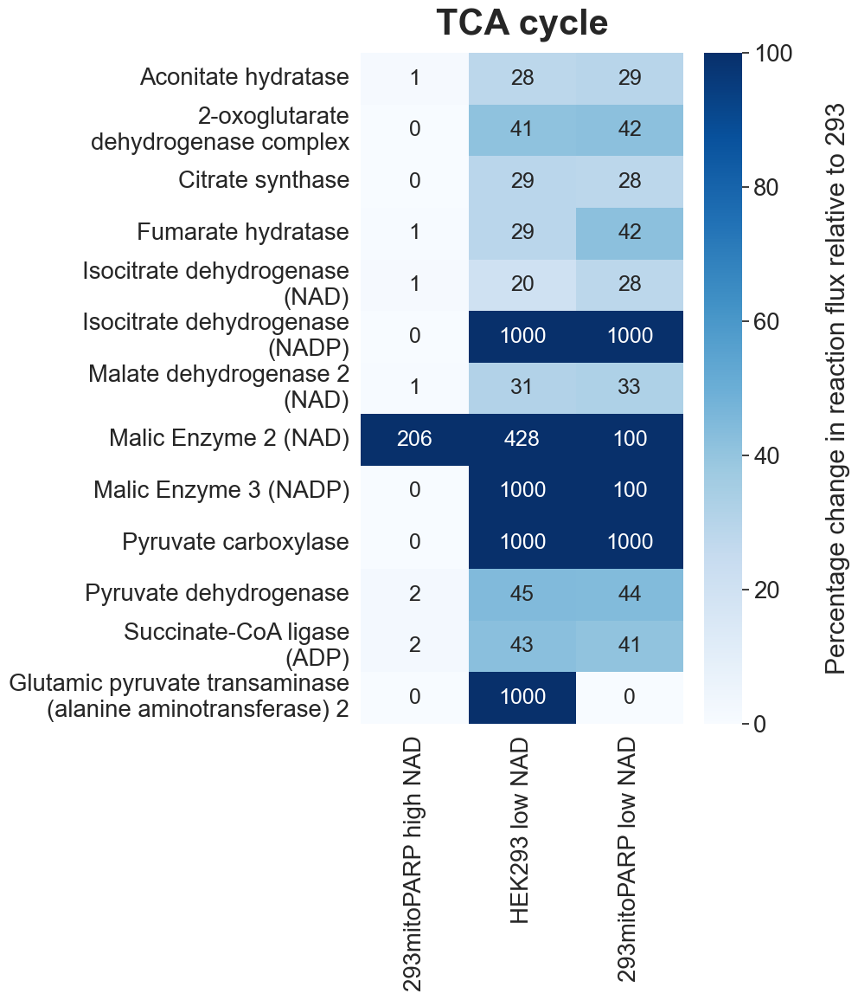

In [34]:
df_sel = transform(
    df_fl.loc[df_fl.subsystem.str.lower().str.endswith("tca cycle"), tags_mito],
    std_cutoff=0.1,
)

limit = 100.0
fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws={"fontsize": "small"},
    norm=get_norm(df_sel),
    size=(shared_y, 12),
    cmap=cmap_perc,
    xrotation=90,
    yrotation=0,
    cbarlabel="\nPercentage change in reaction flux relative to 293",
    font_scale=1.8,
    labels=print_labels[1:],
    fmt=".0f",
    center=None,
    cbar_kws={"aspect": 17.5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f"MISSING {s}"))
ax.set_yticklabels(ylabels)
ax.set_title("TCA cycle", fontdict={"fontsize": 30, "fontweight": "bold"}, pad=15)
pp.tight_layout()
fig.savefig(rxn_path / "tca_cycle_rel.svg", bbox_inches="tight")

## ETC

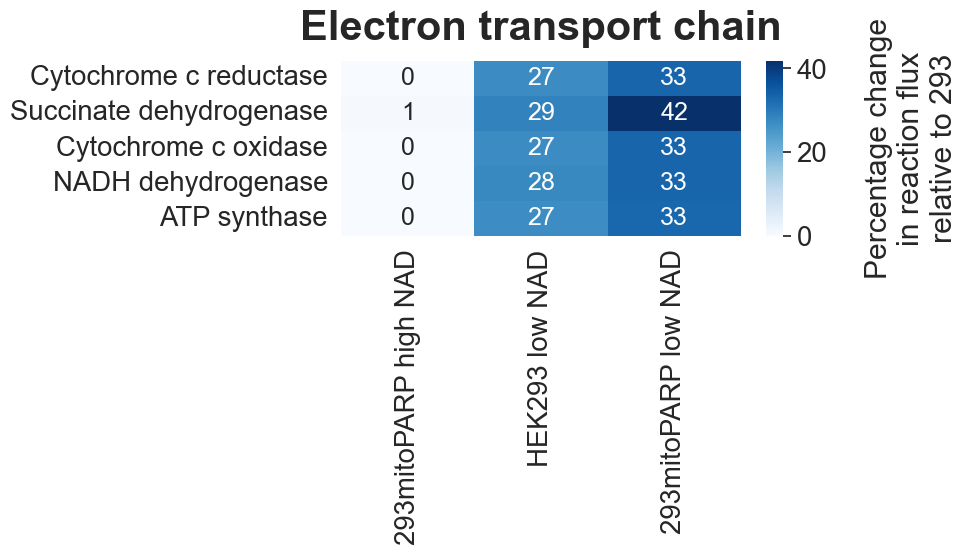

In [35]:
mapping = {
    'CI_MitoCore': 'NADH dehydrogenase',
    'CII_MitoCore': 'Succinate dehydrogenase',
    'CIII_MitoCore': 'Cytochrome c reductase', 
    'CIV_MitoCore': 'Cytochrome c oxidase',
    'CV_MitoCore': 'ATP synthase',
}
df_sel = transform(
    df_fl.loc[df_fl.subsystem.str.lower().\
              str.startswith('electron'), tags_mito],
    std_cutoff = .1
    )

limit = 100.
fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = get_norm(df_sel),
    size=(shared_y,6),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_rel,
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt ='.0f',
    center = None,
    cbar_kws = {'aspect': 10},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Electron transport chain', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

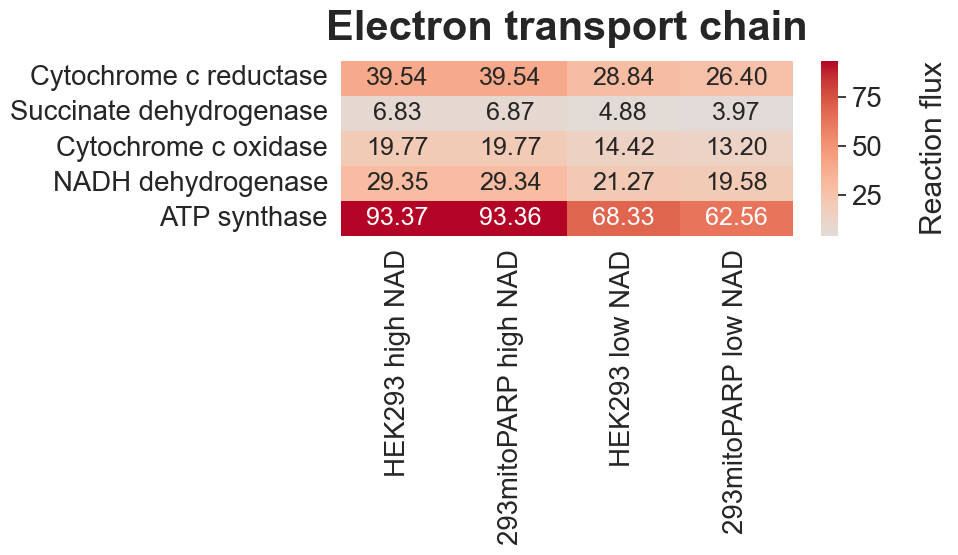

In [36]:
df_sel = df_fl.loc[df_fl.subsystem.str.lower().str.startswith('electron'), tags_mito]
df_sel = df_sel[df_sel.std(axis=1) > .1]


fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = mp.colors.Normalize(
    ),
    center = 1.,
    size=(shared_y,6),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels,
    cbar_kws = {'aspect': 10},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Electron transport chain', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

## Glycolysis

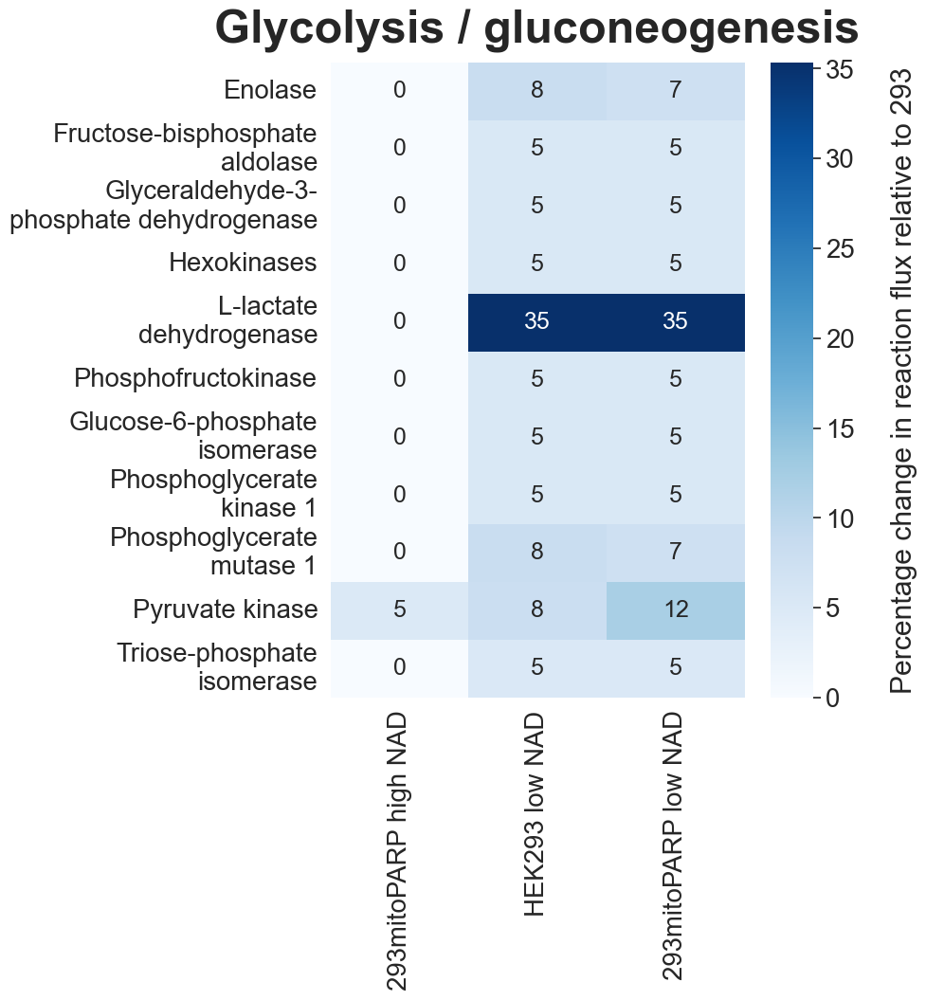

In [37]:
mapping = {
    "ENO": "Enolase",
    "FBA": "Fructose-bisphosphate\naldolase",
    "GAPD": "Glyceraldehyde-3-\nphosphate dehydrogenase",
    "HEX1": "Hexokinases",
    "LDH_L": "L-lactate\ndehydrogenase",
    "PFK": "Phosphofructokinase",
    "PGI": "Glucose-6-phosphate\nisomerase",
    "PGK": "Phosphoglycerate\nkinase 1",
    "PGM": "Phosphoglycerate\nmutase 1",
    "PYK": "Pyruvate kinase",
    "TPI": "Triose-phosphate\nisomerase",
}

df_sel = transform(
    df_fl.loc[df_fl.subsystem.str.lower().str.startswith("glycolysis"), tags_mito], 0.01
)

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws={"fontsize": "small"},
    norm=get_norm(df_sel),
    size=(shared_y, 11),
    cmap=cmap_perc,
    xrotation=90,
    yrotation=0,
    cbarlabel="\nPercentage change in reaction flux relative to 293",
    font_scale=1.8,
    labels=print_labels[1:],
    fmt=".0f",
    center=None,
    cbar_kws={"aspect": 15},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f"MISSING {s}"))
ax.set_yticklabels(ylabels)
ax.set_title(
    "Glycolysis / gluconeogenesis",
    fontdict={"fontsize": 35, "fontweight": "bold"},
    pad=15,
)
pp.tight_layout()
fig.savefig(rxn_path / "glycolysis_rel.svg", bbox_inches="tight")

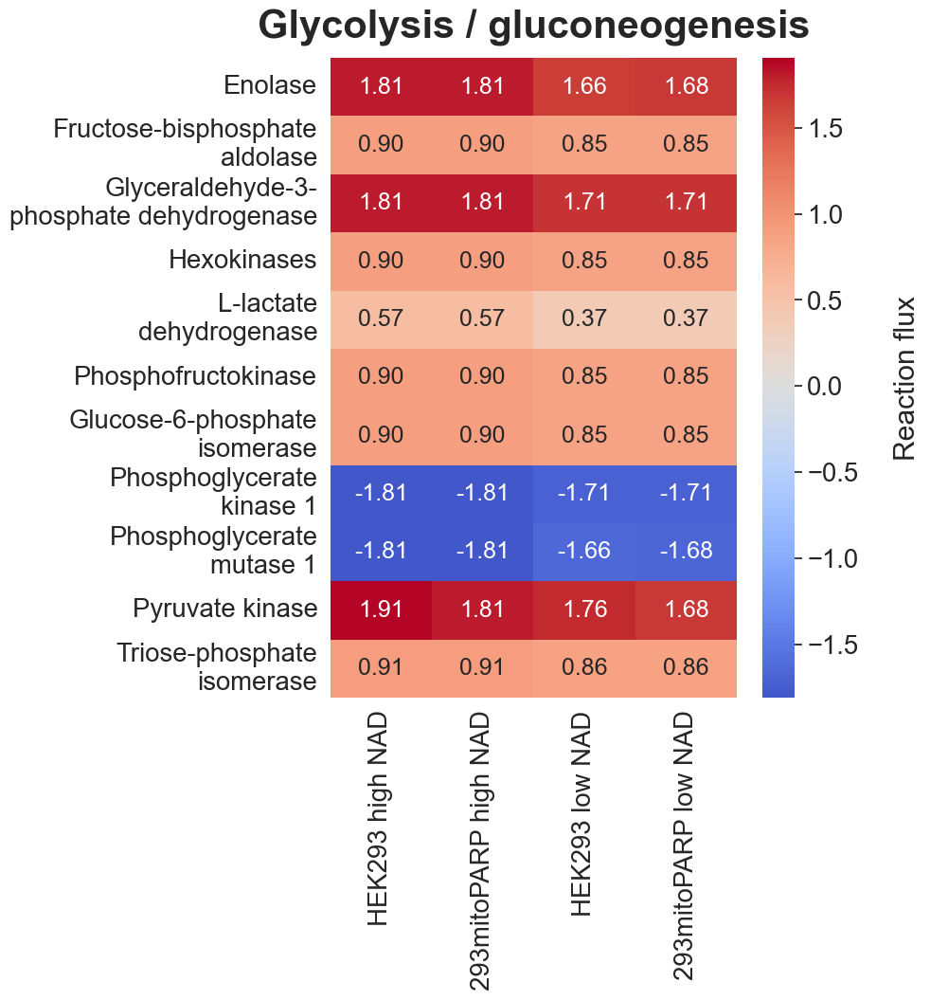

In [38]:
df_sel = df_fl.loc[df_fl.subsystem.str.lower().str.startswith('glycolysis'), tags_mito]
df_sel = df_sel[df_sel.std(axis=1) >= .01]

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = mp.colors.Normalize(),
    size=(shared_y,11),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels[:],
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Glycolysis / gluconeogenesis', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()
fig.savefig(rxn_path / 'glycolysis_abs.svg', bbox_inches='tight')

## Fatty acid metabolism

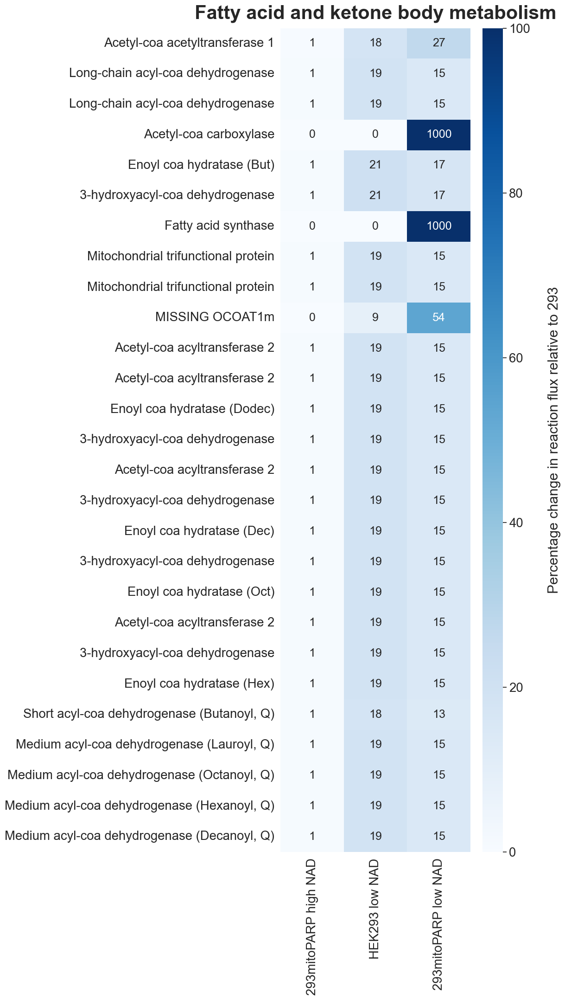

In [39]:
mapping = {
    "ACACT1rm": "Acetyl-coa\nacetyltransferase 1",
    "ACADLC14_MitoCore": "Long-chain acyl-coa\ndehydrogenase",
    "ACADLC16_MitoCore": "Long-chain acyl-coa\ndehydrogenase",
    "ACCOAC": "Acetyl-coa carboxylase",
    "ECOAH1m": "Enoyl coa hydratase (But)",
    "HACD1m": "3-hydroxyacyl-coa\ndehydrogenase",
    "MCOATA": "Fatty acid synthase",
    "MTPC14_MitoCore": "Mitochondrial\ntrifunctional protein",
    "MTPC16_MitoCore": "Mitochondrial\ntrifunctional protein",
    "r0287": "Acetyl-coa\nacyltransferase 2",
    "r0634": "Acetyl-coa\nacyltransferase 2",
    "r0660": "Enoyl coa hydratase (Dodec)",
    "r0722": "3-hydroxyacyl-coa\ndehydrogenase",
    "r0724": "Acetyl-coa\nacyltransferase 2",
    "r0726": "3-hydroxyacyl-coa\ndehydrogenase",
    "r0728": "Enoyl coa hydratase (Dec)",
    "r0730": "3-hydroxyacyl-coa\ndehydrogenase",
    "r0731": "Enoyl coa hydratase (Oct)",
    "r0732": "Acetyl-coa\nacyltransferase 2",
    "r0733": "3-hydroxyacyl-coa\ndehydrogenase",
    "r0734": "Enoyl coa hydratase (Hex)",
    "r1446": "Short acyl-coa\ndehydrogenase (Butanoyl, Q)",
    "r1447": "Medium acyl-coa\ndehydrogenase (Lauroyl, Q)",
    "r1448": "Medium acyl-coa\ndehydrogenase (Octanoyl, Q)",
    "r1450": "Medium acyl-coa\ndehydrogenase (Hexanoyl, Q)",
    "r1451": "Medium acyl-coa\ndehydrogenase (Decanoyl, Q)",
}
mapping = {key: value.replace("\n", " ") for key, value in mapping.items()}
df_sel = transform(df_fl.loc[df_fl.subsystem.str.startswith("FA"), tags_mito], 0.02)

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws={"fontsize": "small"},
    norm=get_norm(df_sel),
    size=(12, 22),
    cmap=cmap_perc,
    xrotation=90,
    yrotation=0,
    cbarlabel="\nPercentage change in reaction flux relative to 293",
    font_scale=1.8,
    labels=print_labels[1:],
    fmt=".0f",
    center=None,
    cbar_kws={"aspect": 40},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f"MISSING {s}"))
ax.set_yticklabels(ylabels)
ax.set_title(
    "Fatty acid and ketone body metabolism",
    fontdict={"fontsize": 30, "fontweight": "bold"},
    pad=15,
)
pp.tight_layout()

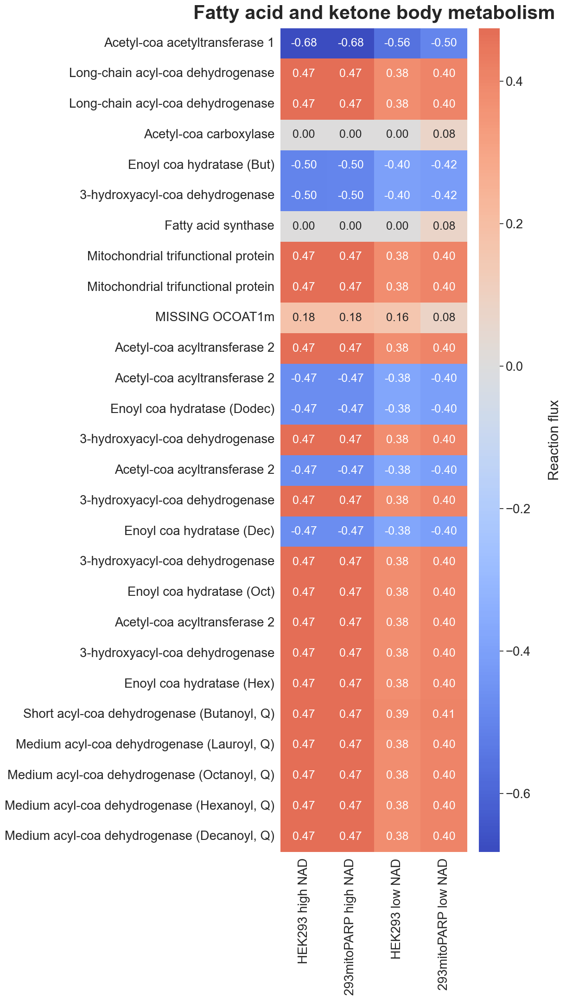

In [40]:
df_sel = df_fl.loc[
    df_fl.subsystem.str.startswith('FA'), 
    tags_mito
]
df_sel = df_sel[df_sel.std(axis=1) >= .02]


limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(12,22),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels,
    cbar_kws = {'aspect': 40},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Fatty acid and ketone body metabolism', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

## GABA shunt

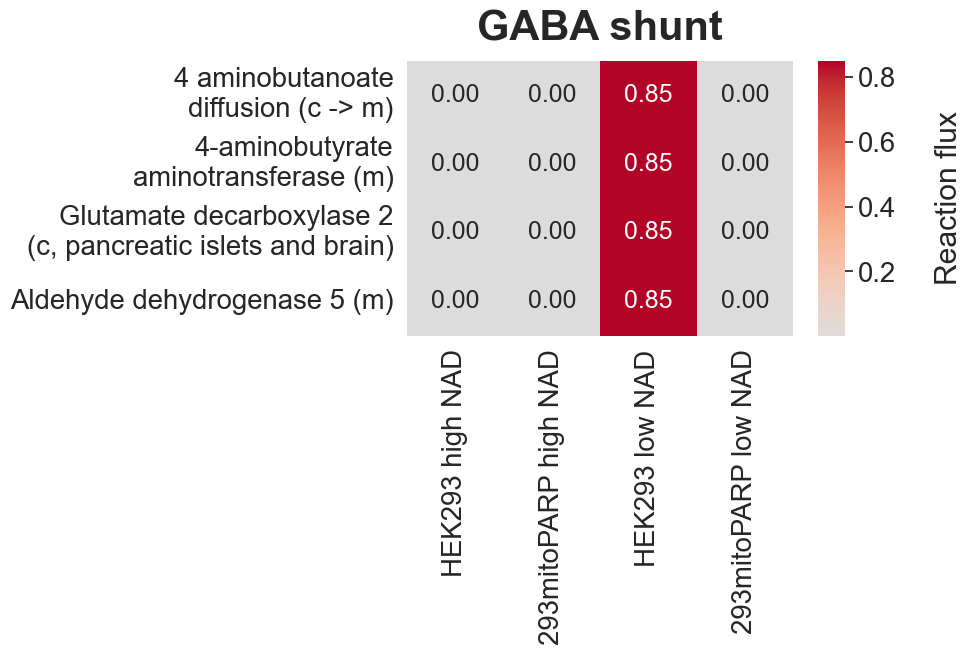

In [41]:
mapping = {
    '4ABUTtm': '4 aminobutanoate\ndiffusion (c -> m)',
    'ABTArm': '4-aminobutyrate\naminotransferase (m)',
    'GLUDC': 'Glutamate decarboxylase 2\n(c, pancreatic islets and brain)',
    'r0178': 'Aldehyde dehydrogenase 5 (m)'
 }
df_sel = df_fl.loc[df_fl.subsystem.str.lower().str.startswith('gaba'), :]
df_sel = df_fl.loc[
        df_fl.subsystem.str.lower().str.startswith('gaba'), 
        tags_mito
    ]

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(10,7),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels[:],
    cbar_kws = {'aspect': 10},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, ''))
ax.set_yticklabels(ylabels)
ax.set_title(
    'GABA shunt', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

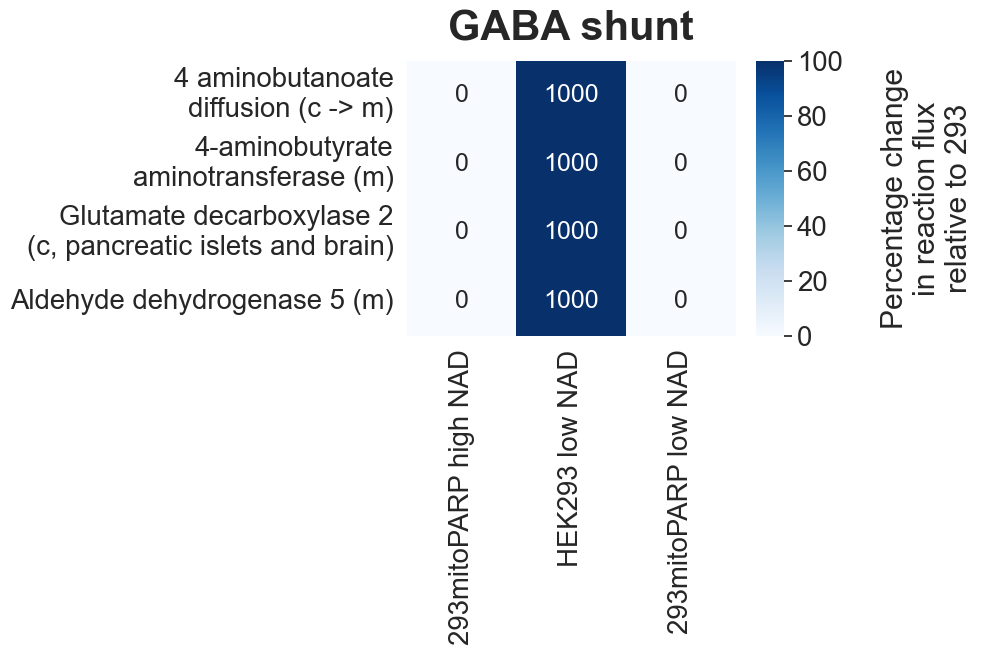

In [42]:
df_sel = transform(df_fl.loc[
        df_fl.subsystem.str.lower().str.startswith('gaba'), 
        tags_mito
    ])

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = get_norm(df_sel),
    size=(10,7),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_rel,
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt ='.0f',
    center = None,
    cbar_kws = {'aspect': 10},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'GABA shunt', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

## Malate Aspartate shuttle

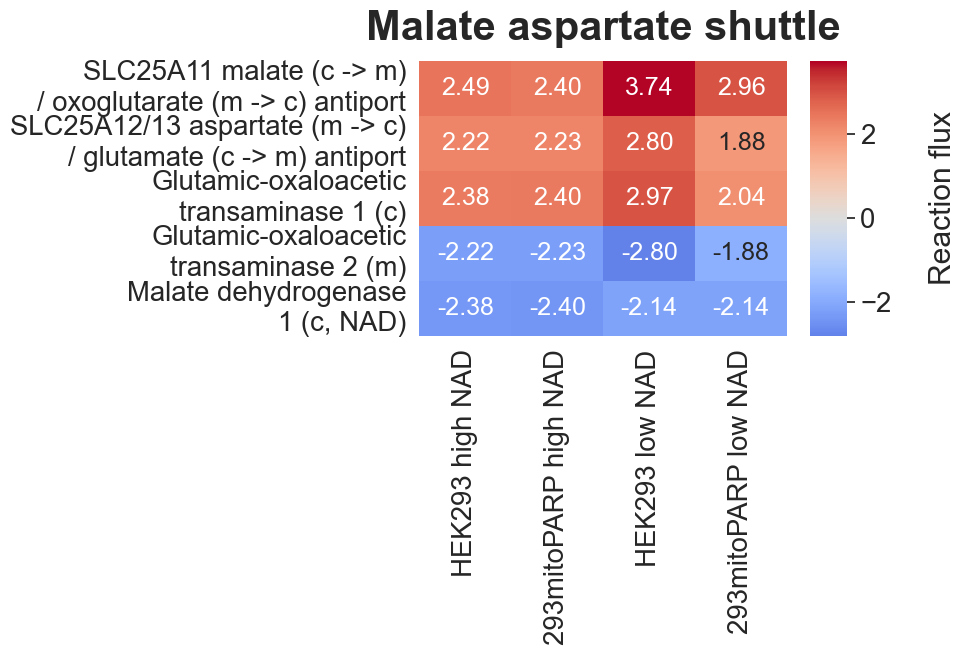

In [43]:
mapping = {
    'AKGMALtm': 'SLC25A11 malate (c -> m)\n/ oxoglutarate (m -> c) antiport',
    'ASPGLUmB_MitoCore': 'SLC25A12/13 aspartate (m -> c)\n/ glutamate (c -> m) antiport',
    'ASPTA': 'Glutamic-oxaloacetic\ntransaminase 1 (c)',
    'ASPTAm': 'Glutamic-oxaloacetic\ntransaminase 2 (m)',
    'MDH': 'Malate dehydrogenase\n1 (c, NAD)'
 }

df_sel = df_fl.loc[
        df_fl.subsystem.str.lower().str.startswith('malate'), 
        tags_mito
    ]
df_sel = df_sel[df_sel.std(axis=1) >= .1]

limit = 10 ** 2
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(shared_y,7),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels,
    cbar_kws = {'aspect': 7.5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, ''))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Malate aspartate shuttle', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()
fig.savefig(rxn_path / 'mal_asp_shuttle_abs.svg', bbox_inches='tight')

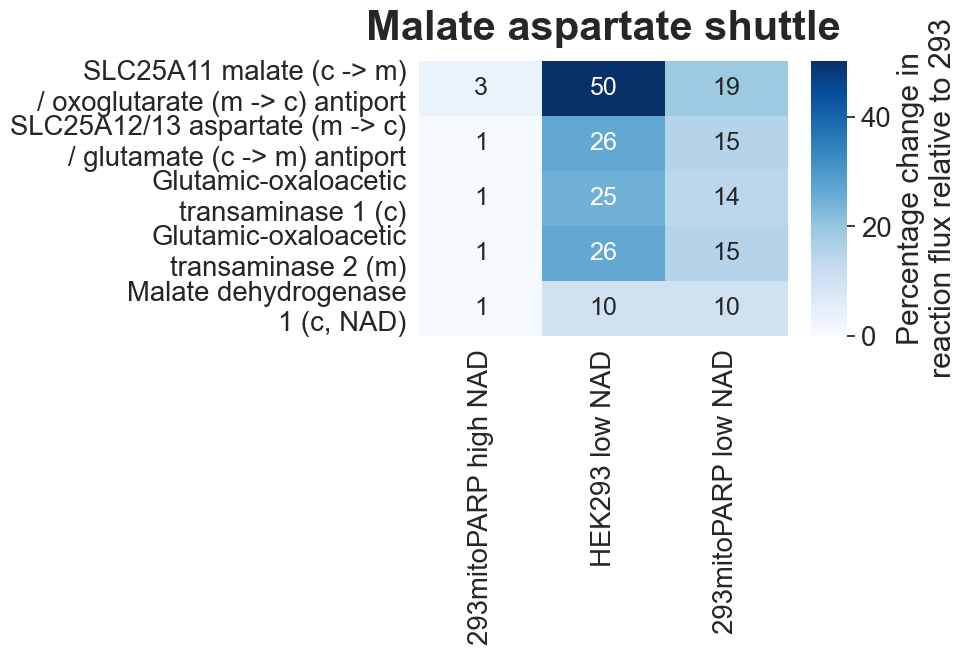

In [44]:
df_sel = transform(df_fl.loc[
        df_fl.subsystem.str.lower().str.startswith('malate'), 
        tags_mito
    ])

limit = 10 ** 2
fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = get_norm(df_sel),
    size=(shared_y,7),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = 'Percentage change in\nreaction flux relative to 293',
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt ='.0f',
    center = None,
    cbar_kws = {'aspect': 7.5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Malate aspartate shuttle', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()
fig.savefig(rxn_path / 'mal_asp_shuttle_rel.svg', bbox_inches='tight')

## Reductive carboxylation / Ac-CoA production

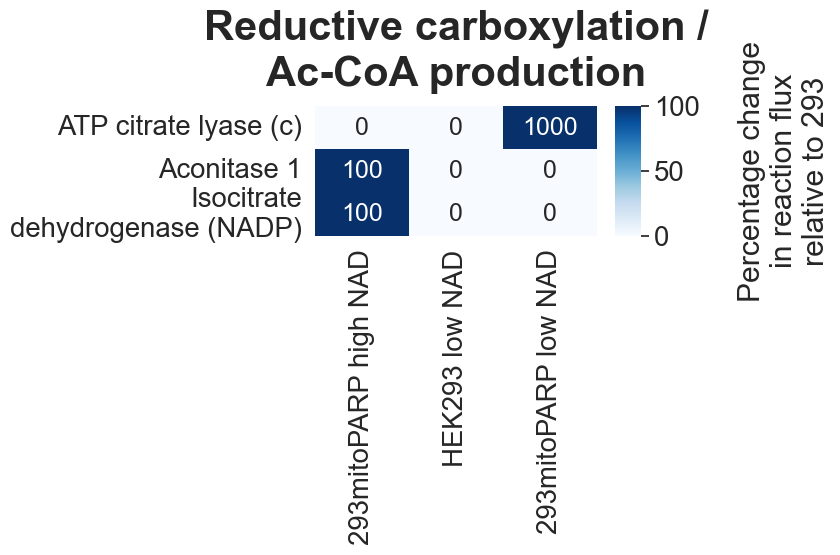

In [45]:
mapping = {
    'ACITL': 'ATP citrate lyase (c)',
    'ACONT': 'Aconitase 1',
    'ICDHy': 'Isocitrate\ndehydrogenase (NADP)'
 }

df_sel = transform(df_fl.loc[
    df_fl.subsystem.str.lower().str.startswith('reductive carboxylation'), 
    tags_mito
])

limit = 10 ** 2
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = get_norm(df_sel),
    size=(9,6),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_rel,
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt ='.0f',
    center = None,
    cbar_kws = {'aspect': 5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, ''))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Reductive carboxylation /\nAc-CoA production', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

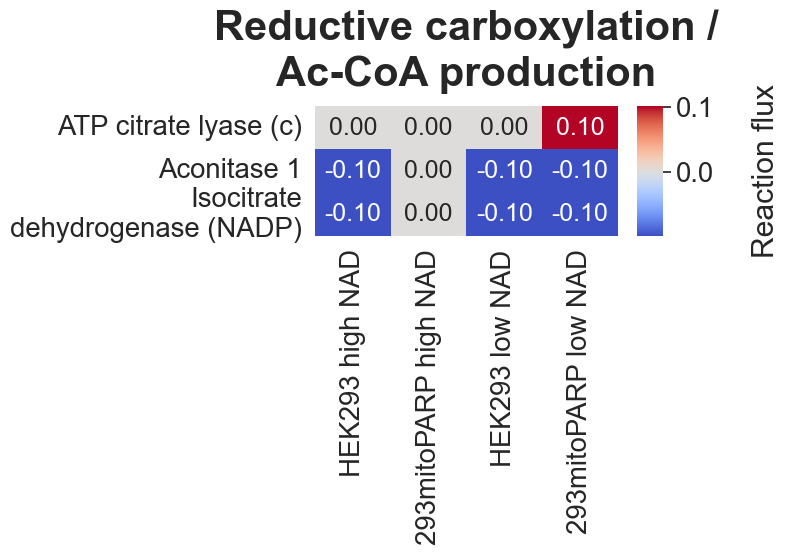

In [46]:
df_sel = df_fl.loc[
    df_fl.subsystem.str.lower().str.startswith('reductive carboxylation'), 
    tags_mito
]

limit = 10 ** 2
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = mp.colors.Normalize(),
    size=(9,6),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels,
    cbar_kws = {'aspect': 5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, ''))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Reductive carboxylation /\nAc-CoA production', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

## Carnitine shuttle

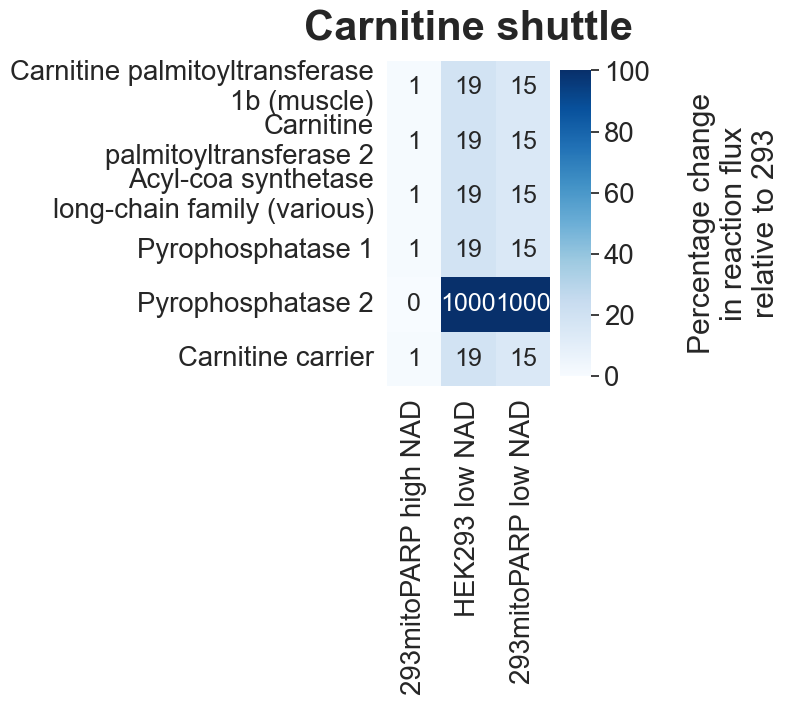

In [47]:
df_sel = transform(df_fl.loc[
    df_fl.subsystem.str.lower().str.startswith('carnitine'), 
    tags_mito
])

limit = 10 ** 2
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = get_norm(df_sel),
    size=(8,7.5),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_rel,
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt ='.0f',
    center = None,
    cbar_kws = {'aspect': 10},
)
ylabels = format_paths(df_sel.index)
ax.set_yticklabels(ylabels)
ax.set_title(
    'Carnitine shuttle', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

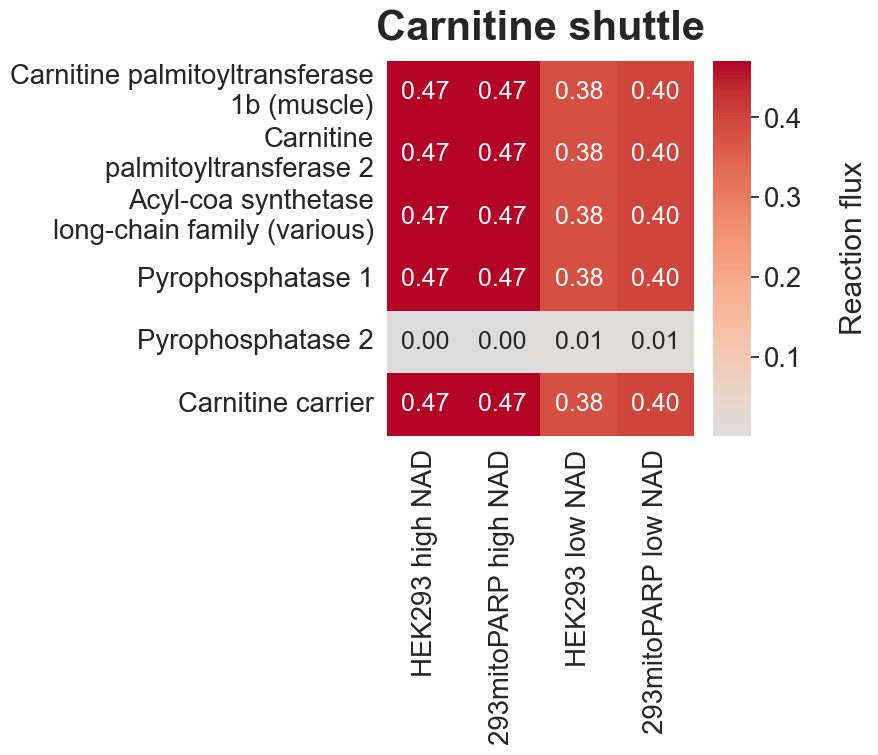

In [48]:
df_sel = df_fl.loc[
    df_fl.subsystem.str.lower().str.startswith('carnitine'), 
    tags_mito
]

limit = 10 ** 2
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(9,8),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels,
    cbar_kws = {'aspect': 10},
)
ylabels = format_paths(df_sel.index)
ax.set_yticklabels(ylabels)
ax.set_title(
    'Carnitine shuttle', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

## Serine and glycine biosynthesis

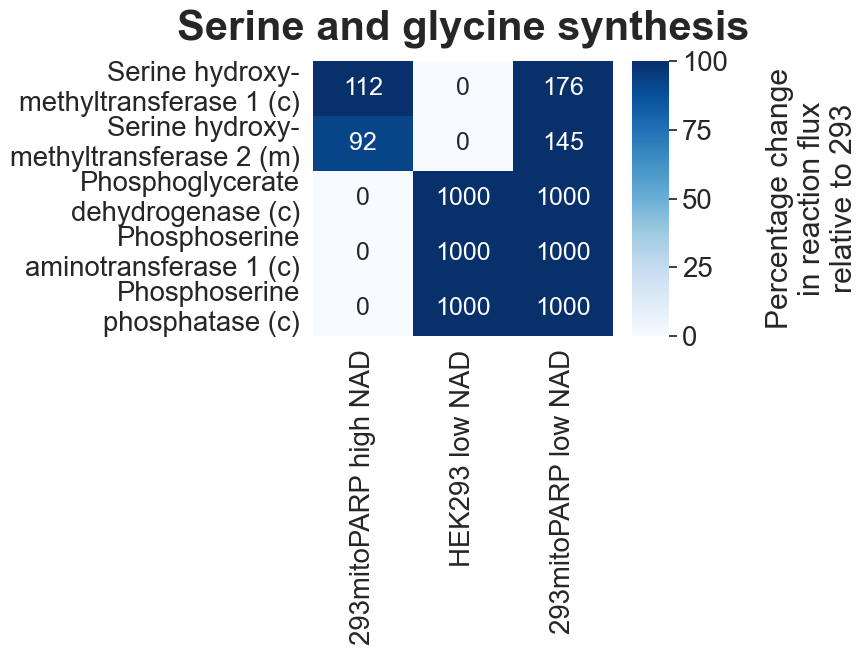

In [49]:
mapping = {
    'GHMT2r': 'Serine hydroxy-\nmethyltransferase 1 (c)',
    'GHMT2rm': 'Serine hydroxy-\nmethyltransferase 2 (m)',
    'PGCD': 'Phosphoglycerate\ndehydrogenase (c)',
    'PSERT': 'Phosphoserine\naminotransferase 1 (c)',
    'PSP_L': 'Phosphoserine\nphosphatase (c)'
 }
df_sel = transform(df_fl.loc[
    df_fl.subsystem.str.lower().str.startswith('serine and glycine'), 
    tags_mito
])

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = get_norm(df_sel),
    size=(9,7),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_rel,
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt ='.0f',
    center = None,
    cbar_kws = {'aspect': 7.5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, ''))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Serine and glycine synthesis', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

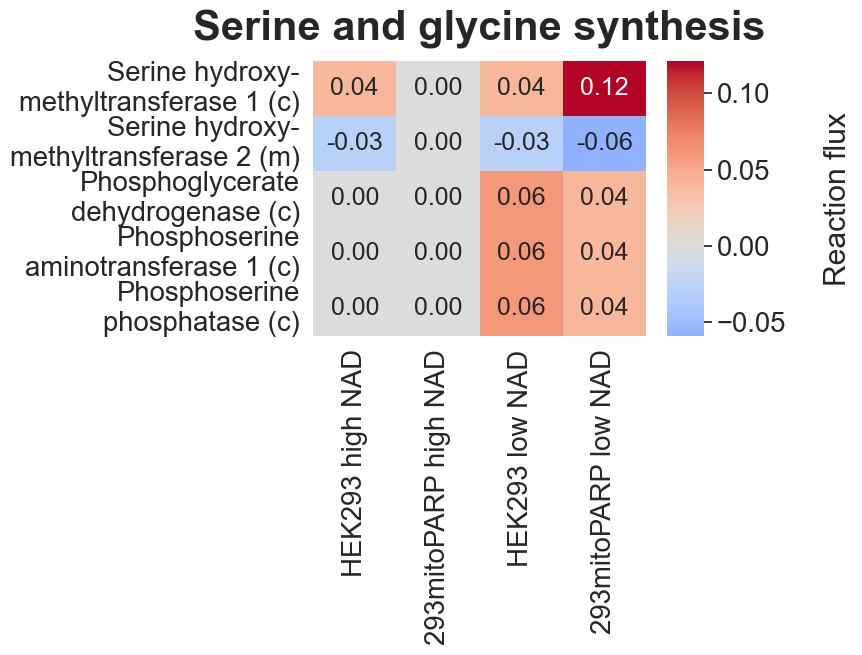

In [50]:
df_sel = df_fl.loc[
    df_fl.subsystem.str.lower().str.startswith('serine and glycine'),
    tags_mito
]

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(9,7),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels,
    cbar_kws = {'aspect': 7.5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Serine and glycine synthesis', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

## Glycine cleavage system

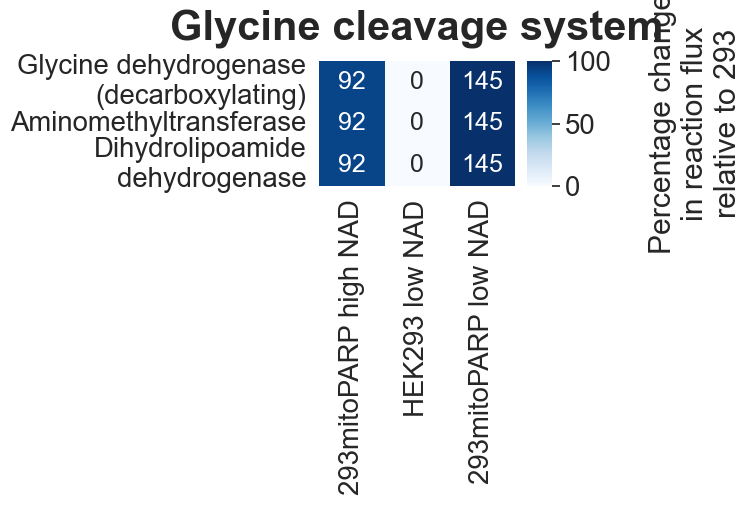

In [51]:
df_sel = transform(df_fl.loc[
    df_fl.subsystem.str.lower().str.endswith('gcs)'), 
    tags_mito
])

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = get_norm(df_sel),
    size=(8,5.5),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_rel,
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt ='.0f',
    center = None,
    cbar_kws = {'aspect': 5},
)
ylabels = format_paths(df_sel.index)
ax.set_yticklabels(ylabels)
ax.set_title(
    'Glycine cleavage system', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

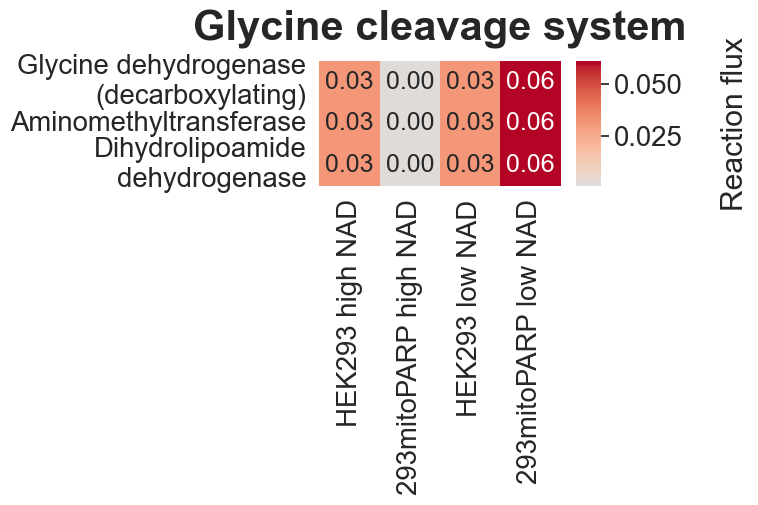

In [52]:
df_sel = df_fl.loc[
    df_fl.subsystem.str.lower().str.endswith('gcs)'), 
    tags_mito
]

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(8,5.5),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels,
    cbar_kws = {'aspect': 5},
)
ylabels = format_paths(df_sel.index)
ax.set_yticklabels(ylabels)
ax.set_title(
    'Glycine cleavage system', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

## Folate cytosolic

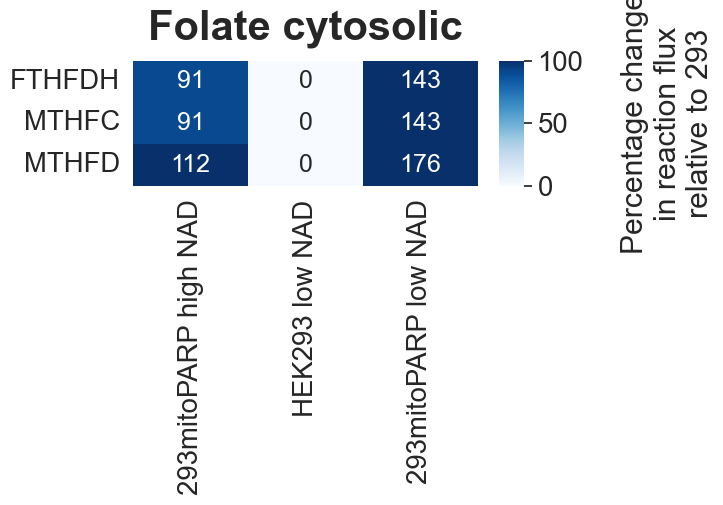

In [53]:
df_sel = transform(df_fl.loc[
    df_fl.subsystem.str.lower().str.startswith('folate'), 
    tags_mito
], .01)

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = get_norm(df_sel),
    size=(8,5.5),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_rel,
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt ='.0f',
    center = None,
    cbar_kws = {'aspect': 5},
)
ylabels = format_paths(df_sel.index)
ax.set_title(
    'Folate cytosolic', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

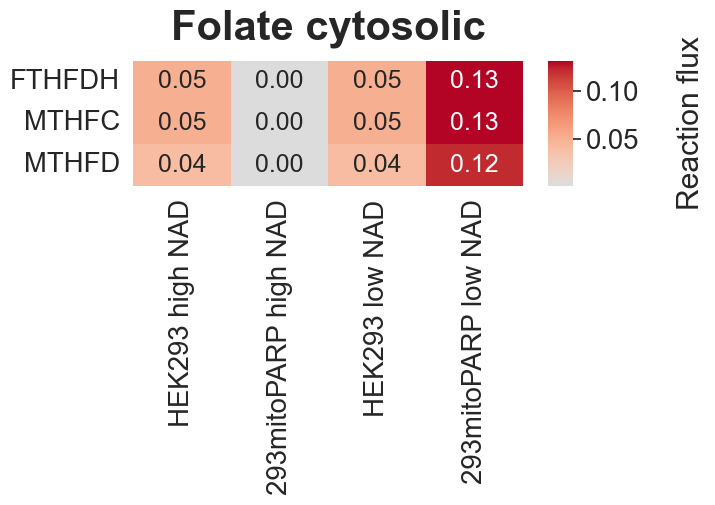

In [54]:
df_sel = df_fl.loc[
    df_fl.subsystem.str.lower().str.startswith('folate'), 
    tags_mito
]
df_sel = df_sel[df_sel.std(axis=1) >= .01]

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(8,5.5),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels,
    cbar_kws = {'aspect': 5},
)
ylabels = format_paths(df_sel.index)
ax.set_title(
    'Folate cytosolic', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

## Glutamate degradation / synthesis

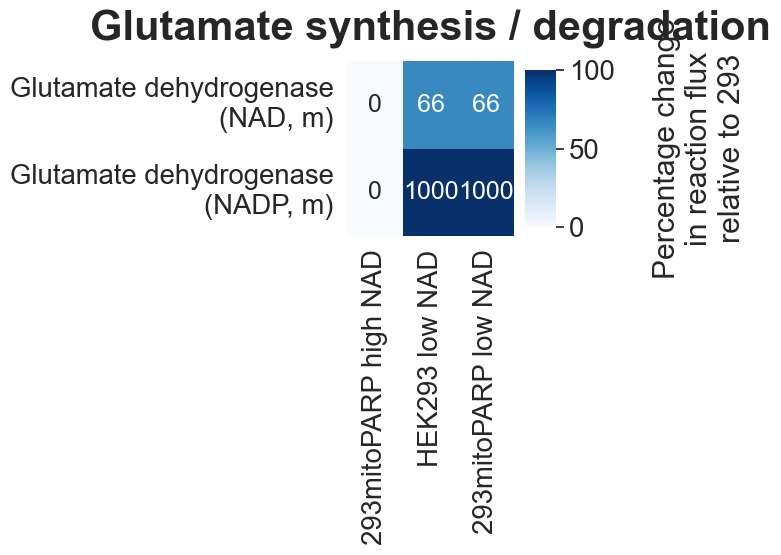

In [55]:
mapping = {
    'GLUDxi': 'Glutamate dehydrogenase\n(NAD, c)',
    'GLUDxm': 'Glutamate dehydrogenase\n(NAD, m)',
    'GLUDym': 'Glutamate dehydrogenase\n(NADP, m)'
 }
df_sel = transform(df_fl.loc[
    df_fl.subsystem.str.lower().str.startswith('gluta'), 
    tags_mito
], .01)

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = get_norm(df_sel),
    size=(8,6),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_rel,
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt ='.0f',
    center = None,
    cbar_kws = {'aspect': 5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Glutamate synthesis / degradation', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

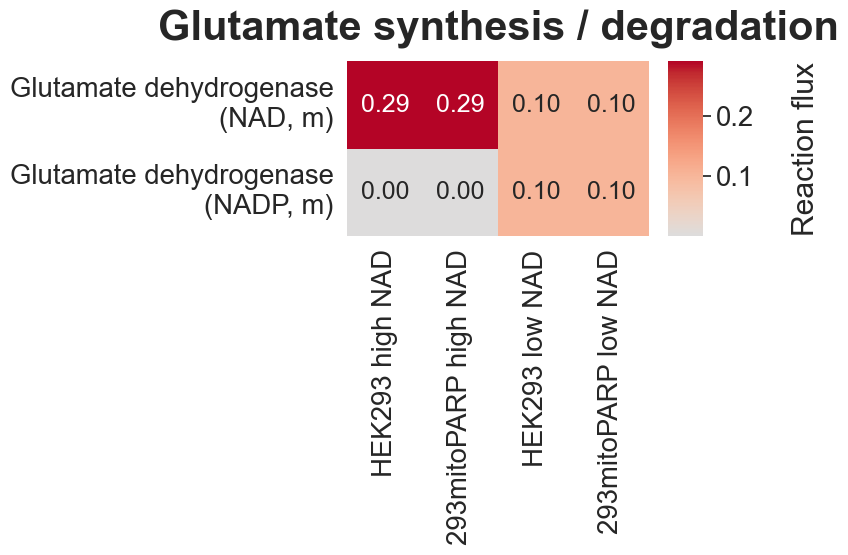

In [56]:
df_sel = df_fl.loc[
    df_fl.subsystem.str.lower().str.startswith('gluta'), 
    tags_mito
]
df_sel = df_sel[df_sel.std(axis=1) >= .01]

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(9,6),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels,
    cbar_kws = {'aspect': 5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Glutamate synthesis / degradation', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

## Cytosolic misc

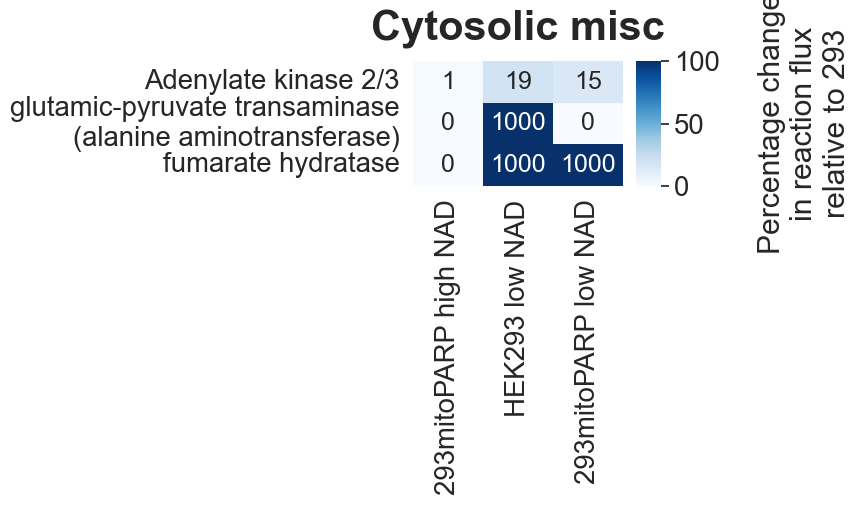

In [57]:
mapping = {
    'ADK1': 'Adenylate kinase 2/3',
    'ALATA_L': 'glutamic-pyruvate transaminase\n(alanine aminotransferase)',
    'FUM': 'fumarate hydratase'
 }
df_sel = transform(df_fl.loc[
    df_fl.subsystem.str.lower().str.startswith('cytosolic misc'), 
    tags_mito
], .01)

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(9,5.5),
    norm = get_norm(df_sel),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_rel,
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt ='.0f',
    center = None,
    cbar_kws = {'aspect': 5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Cytosolic misc', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

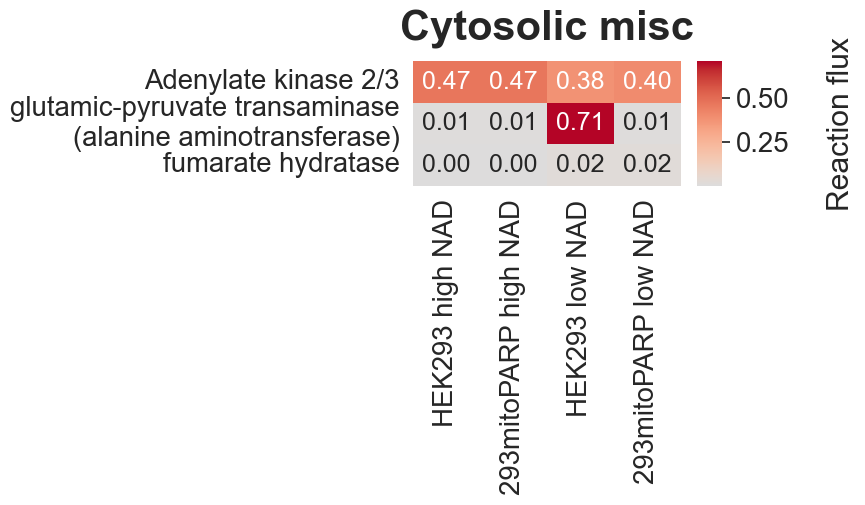

In [58]:
df_sel = df_fl.loc[
    df_fl.subsystem.str.lower().str.startswith('cytosolic misc'), 
    tags_mito
]
df_sel = df_sel[df_sel.std(axis=1) >= .01]

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(9,5.5),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels,
    cbar_kws = {'aspect': 5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Cytosolic misc', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

## Selection from dropped

In [59]:
df_rel = deepcopy(df_fl.loc[:, tags_mito])
for i, col in enumerate(df_rel.columns):
    df_rel.iloc[:, i] = (df_fl.iloc[:, i] / df_fl.iloc[:, 0])
df_rel = (1. - (df_rel.iloc[:,1:].dropna())) * -100.
df_rel = pd.concat([df_rel, df_fl['subsystem']], axis=1).dropna()
df_rel.head()

,mitoparp + high NAD,293 + low NAD,mitoparp + low NAD,subsystem
2HBO,-1.000000e+02,-0.000000e+00,-1.000000e+02,Threonine and Methionine degradation
2HBt2,-1.000000e+02,-0.000000e+00,-1.000000e+02,Boundary Conditions - Biomarkers
2OXOADOXm,-0.000000e+00,-0.000000e+00,-0.000000e+00,Tryptophan / Lysine Metabolism
3HBCOAHLm,-9.103829e-12,-9.103829e-12,-9.103829e-12,Valine degradation
ACACT10m,-0.000000e+00,-0.000000e+00,-0.000000e+00,Isoleucine degradation


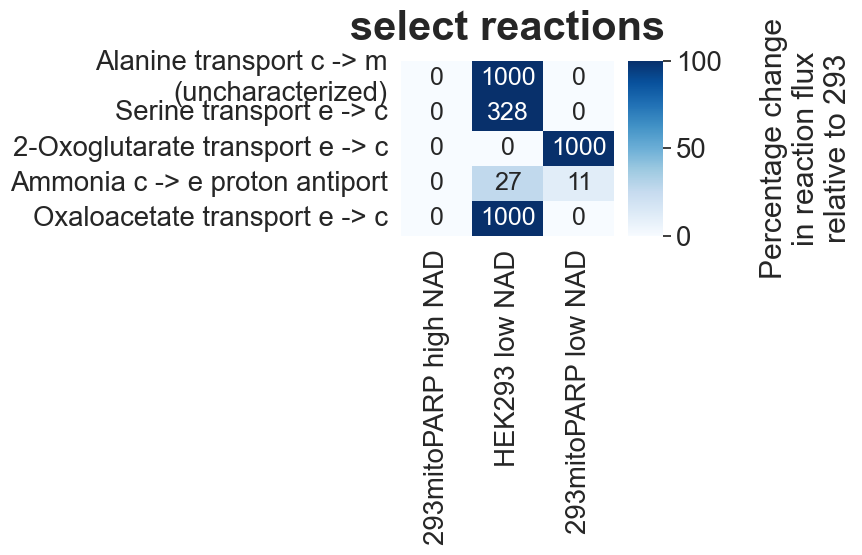

In [60]:
sel = {
    'r1434': 'Alanine transport c -> m\n(uncharacterized)',
    'r2526': 'Serine transport e -> c',
    'AKGt_MitoCore': '2-Oxoglutarate transport e -> c',
    'NH4t3r': 'Ammonia c -> e proton antiport',
    'OAAt_MitoCore': 'Oxaloacetate transport e -> c',
}
df_sel = transform(
    df_fl.loc[sel.keys(), tags_mito]
)
limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(9,6),
    norm = get_norm(df_sel),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_rel,
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt ='.0f',
    center = None,
    cbar_kws = {'aspect': 5},
)
ylabels = df_sel.index.map(lambda s: sel.get(s, ''))
ax.set_yticklabels(ylabels)
ax.set_title(
    'select reactions', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

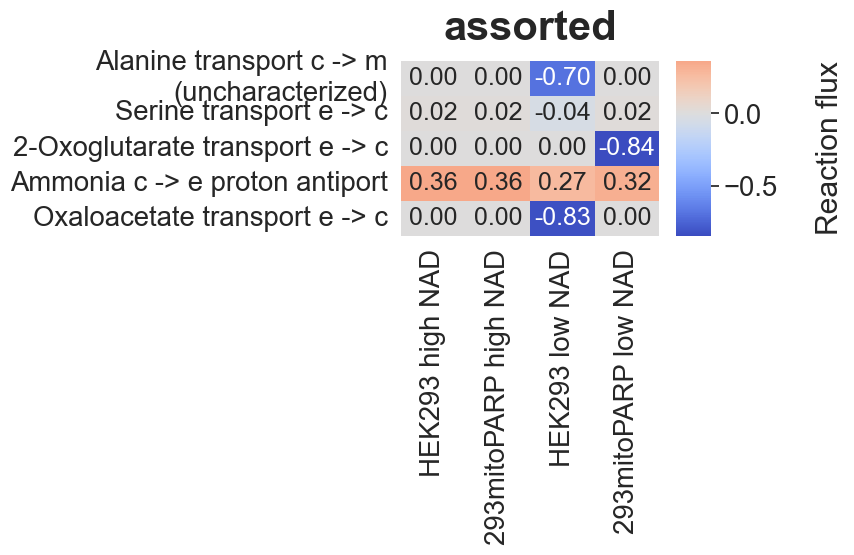

In [61]:
df_sel = df_fl.loc[sel.keys(), tags_mito]
df_sel = df_sel[df_sel.std(axis=1) >= .01]
limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(9,6),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels,
    cbar_kws = {'aspect': 5},
)
ylabels = df_sel.index.map(lambda s: sel.get(s, ''))
ax.set_yticklabels(ylabels)
ax.set_title(
    'assorted', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

## Boundary conditions all

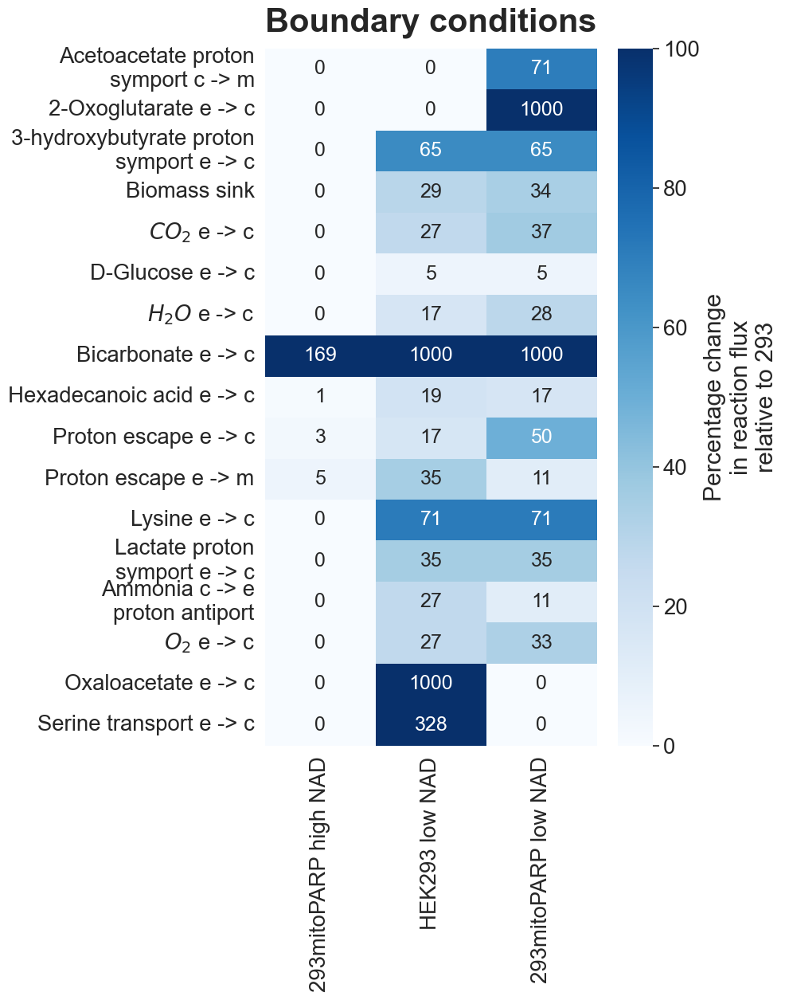

In [62]:
mapping = {
    'ACACt2': 'Acetoacetate proton\nsymport c -> m',
    'BHBt': '3-hydroxybutyrate proton\nsymport e -> c',
    'Biomass_MitoCore': 'Biomass sink',
    'CO2t': '$CO_2$ e -> c',
    'GLCt1r': 'D-Glucose e -> c',
    'H2Ot': '$H_2O$ e -> c',
    'HCO3t_MitoCore': 'Bicarbonate e -> c',
    'HDCAtr': 'Hexadecanoic acid e -> c',
    'Hct_MitoCore': 'Proton escape e -> c',
    'Hmt_MitoCore': 'Proton escape e -> m',
    'LYStiDF': 'Lysine e -> c',
    'L_LACt2r': 'Lactate proton\nsymport e -> c',
    'O2t': '$O_2$ e -> c',
    #
    'AKGt_MitoCore': '2-Oxoglutarate e -> c',
    'NH4t3r': 'Ammonia c -> e\nproton antiport',
    'OAAt_MitoCore': 'Oxaloacetate e -> c',
    'r2526': 'Serine transport e -> c',
}
path = 'Boundary conditions'
rxns = (df_fl.subsystem.str.lower().str.startswith('boundary'))
df_sel = transform(
    df_fl.loc[rxns, tags_mito],
    .01
)

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = get_norm(df_sel),
    size=(shared_y,13),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = 'Percentage change\nin reaction flux\nrelative to 293',
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt ='.0f',
    center = None,
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    path, 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

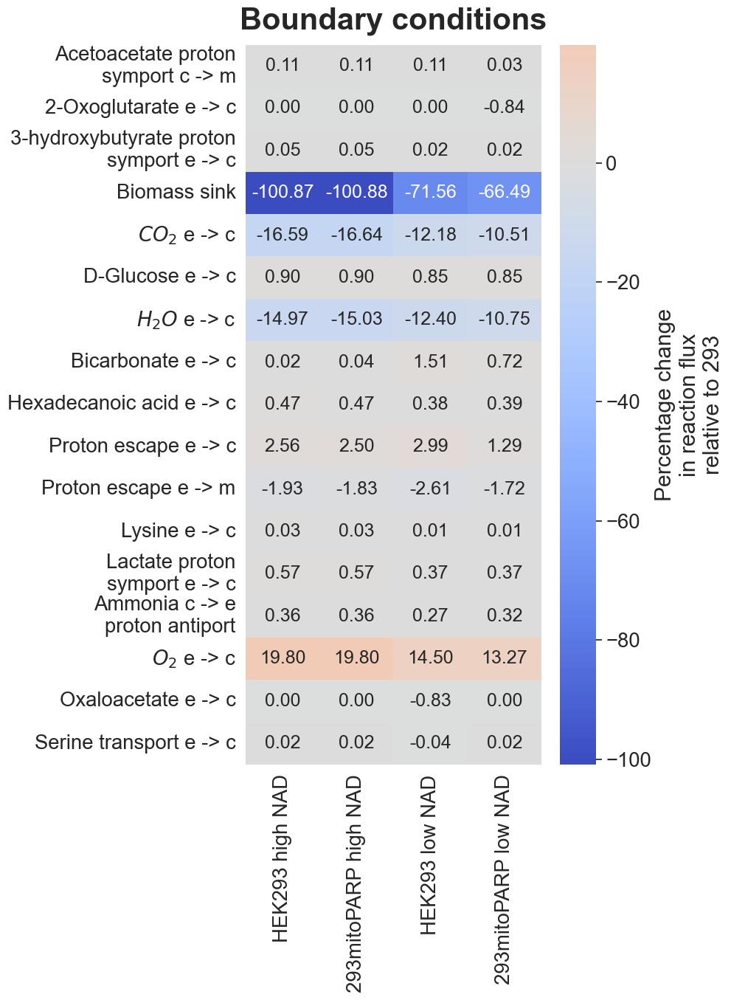

In [63]:

rxns = (df_fl.subsystem.str.lower().str.startswith('boundary'))
df_sel = df_fl.loc[rxns, tags_mito]
df_sel = df_sel[df_sel.std(axis = 1) >= .01]

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(shared_y,14),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = 'Percentage change\nin reaction flux\nrelative to 293',
    font_scale = 1.8,
    labels = print_labels[:],
    fmt ='.2f',
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    path, 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

## Boundary conditions - Biomarkers and amino acids

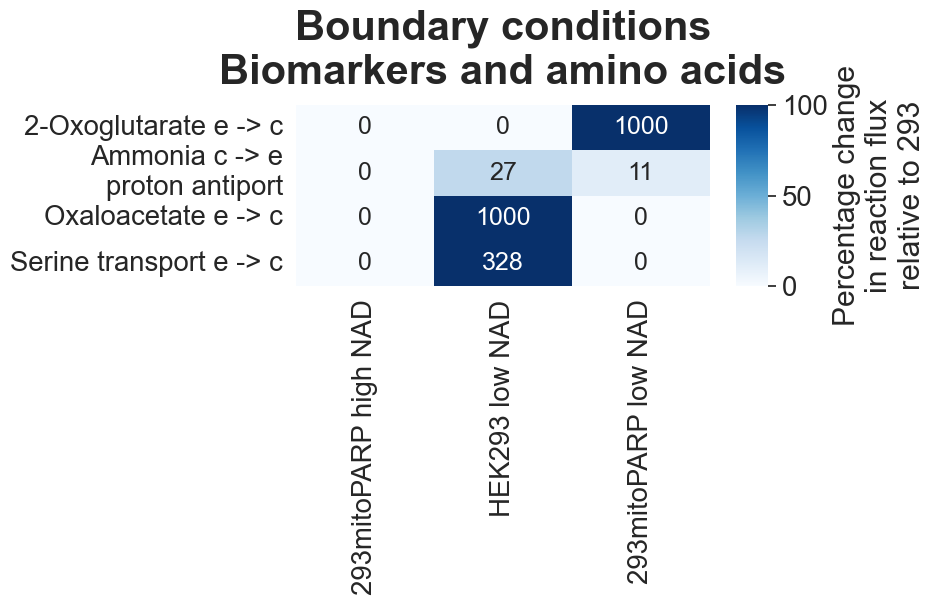

In [64]:
mapping = {
    'AKGt_MitoCore': '2-Oxoglutarate e -> c',
    'NH4t3r': 'Ammonia c -> e\nproton antiport',
    'OAAt_MitoCore': 'Oxaloacetate e -> c',
    'r2526': 'Serine transport e -> c',
}
path = 'Boundary conditions\nBiomarkers and amino acids'
rxns = (df_fl.subsystem == 'Boundary Conditions - Biomarkers') \
    | (df_fl.subsystem == 'Boundary conditions - nonessential amino acids')\
    | (df_fl.subsystem == 'Boundary Conditions - essential amino acids')
df_sel = transform(
    df_fl.loc[rxns, tags_mito],
    .01
)

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = get_norm(df_sel),
    size=(shared_y,6.5),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = 'Percentage change\nin reaction flux\nrelative to 293',
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt ='.0f',
    center = None,
    cbar_kws = {'aspect': 5.5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    path, 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

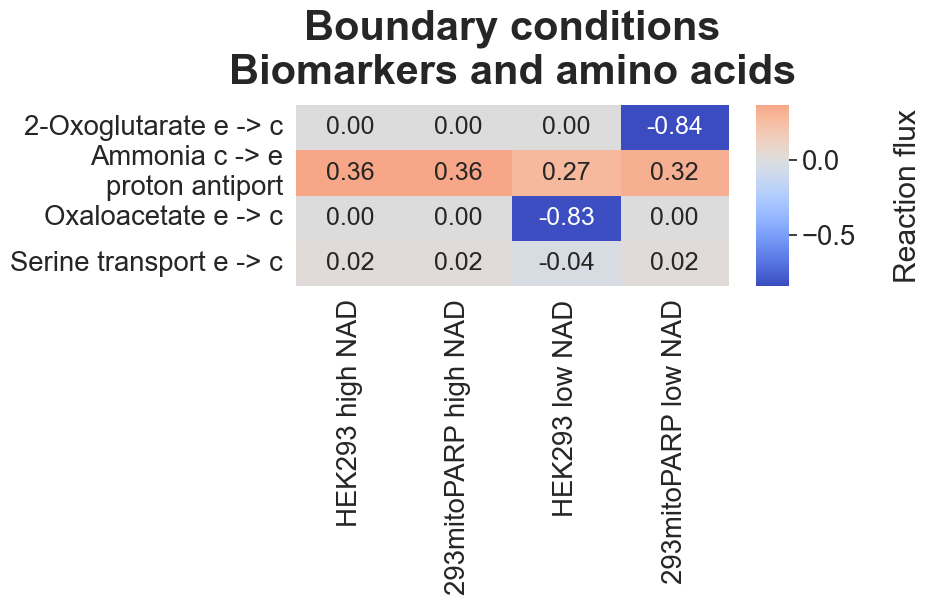

In [65]:
df_sel = df_fl.loc[rxns, tags_mito]
df_sel = df_sel[df_sel.std(axis=1) >= .01]

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(shared_y,6.5),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels,
    fmt ='.2f',
    cbar_kws = {'aspect': 5.5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    path, 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

## Mitochondrial transporters uncharacterized

AKGt: 2-Oxoglutarate -> negative means secretion  
OAAt: Oxaloacetate -> negative means secretion

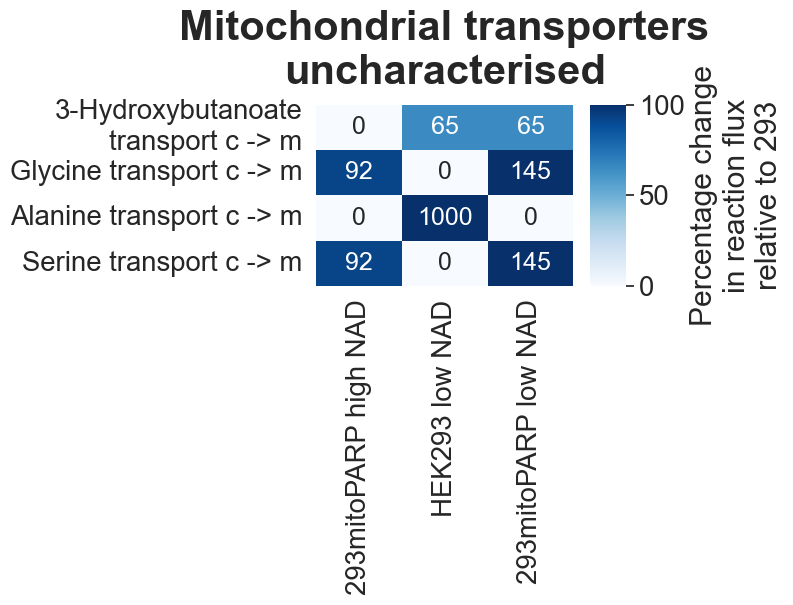

In [66]:
mapping = {
    'BHBtmB_MitoCore': '3-Hydroxybutanoate\ntransport c -> m',
    'GLYtm': 'Glycine transport c -> m',
    'LEUt5m': 'Leucine carrier c -> m',
    'r1434': 'Alanine transport c -> m',
    'r1435': 'Serine transport c -> m',
}
path = 'Mitochondrial transporters - uncharacterised'
df_sel = transform(
    df_fl.loc[df_fl.subsystem == path, tags_mito],
    .01
)

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = get_norm(df_sel),
    size=(8.5,6.5),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = 'Percentage change\nin reaction flux\nrelative to 293',
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt = '.0f',
    center = None,
    cbar_kws = {'aspect': 5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Mitochondrial transporters\nuncharacterised', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

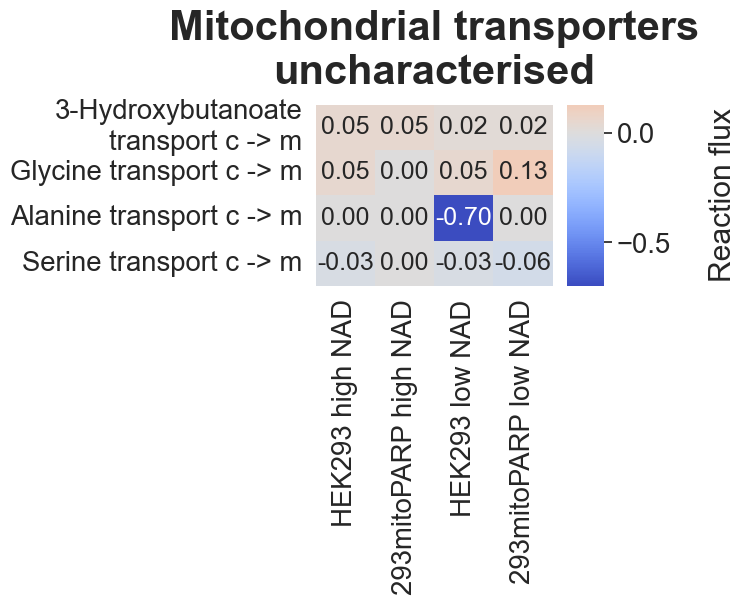

In [67]:
df_sel = df_fl.loc[df_fl.subsystem == path, tags_mito]
df_sel = df_sel[df_sel.loc[:, tags_mito].std(axis=1) >= .01]

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel.round(2) + epsilon,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    size=(8,6.5),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = cbarlabel_abs,
    font_scale = 1.8,
    labels = print_labels,
    cbar_kws = {'aspect': 5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Mitochondrial transporters\nuncharacterised', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

## Mitochondrial transporters characterized

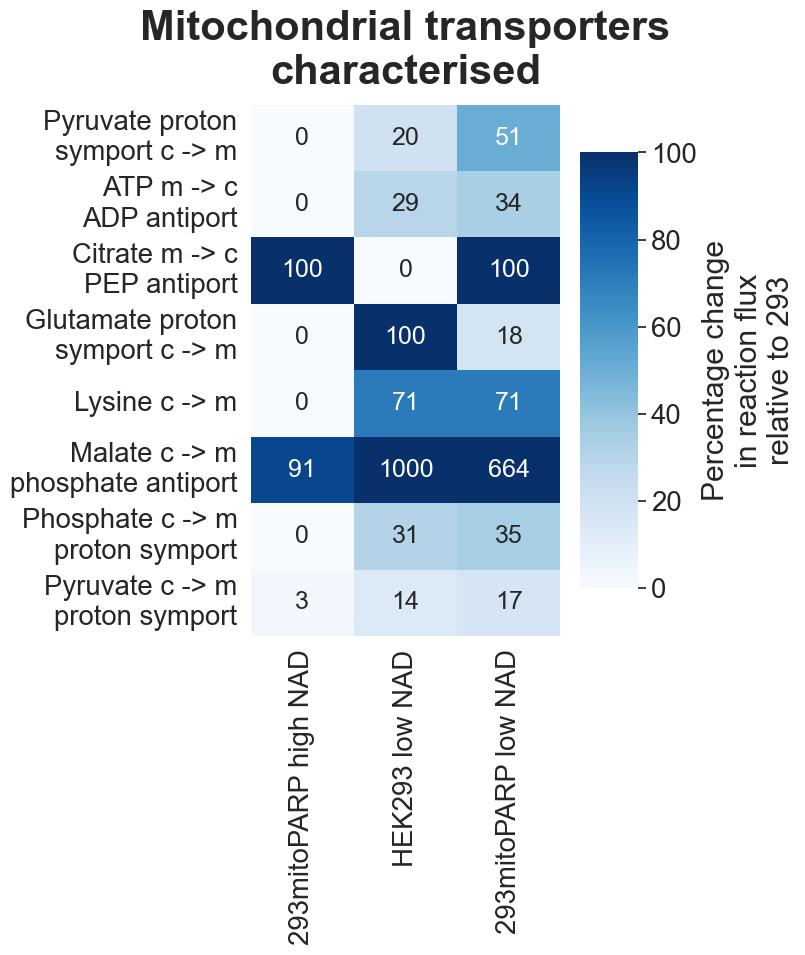

In [68]:
mapping = {
    'ACACt2mB_MitoCore': 'Pyruvate proton\nsymport c -> m',
    'ATPtmB_MitoCore': 'ATP m -> c\nADP antiport',
    'CITtbm': 'Citrate m -> c\nPEP antiport',
    'GLUt2mB_MitoCore': 'Glutamate proton\nsymport c -> m',
    'LYStmB_MitoCore': 'Lysine c -> m',
    'MALtm': 'Malate c -> m\nphosphate antiport',
    'PIt2mB_MitoCore': 'Phosphate c -> m\nproton symport',
    'PYRt2m': 'Pyruvate c -> m\nproton symport',
}
path = 'Mitochondrial transporters - characterised'
df_sel = transform(
    df_fl.loc[df_fl.subsystem == path, tags_mito],
    .01
)

fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = get_norm(df_sel),
    size=(8.5, 10.),
    cmap=cmap_perc,
    xrotation = 90,
    yrotation=0,
    cbarlabel = 'Percentage change\nin reaction flux\nrelative to 293',
    font_scale = 1.8,
    labels = print_labels[1:],
    fmt = '.0f',
    center = None,
    cbar_kws = {'aspect': 7.5},
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Mitochondrial transporters\ncharacterised', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()

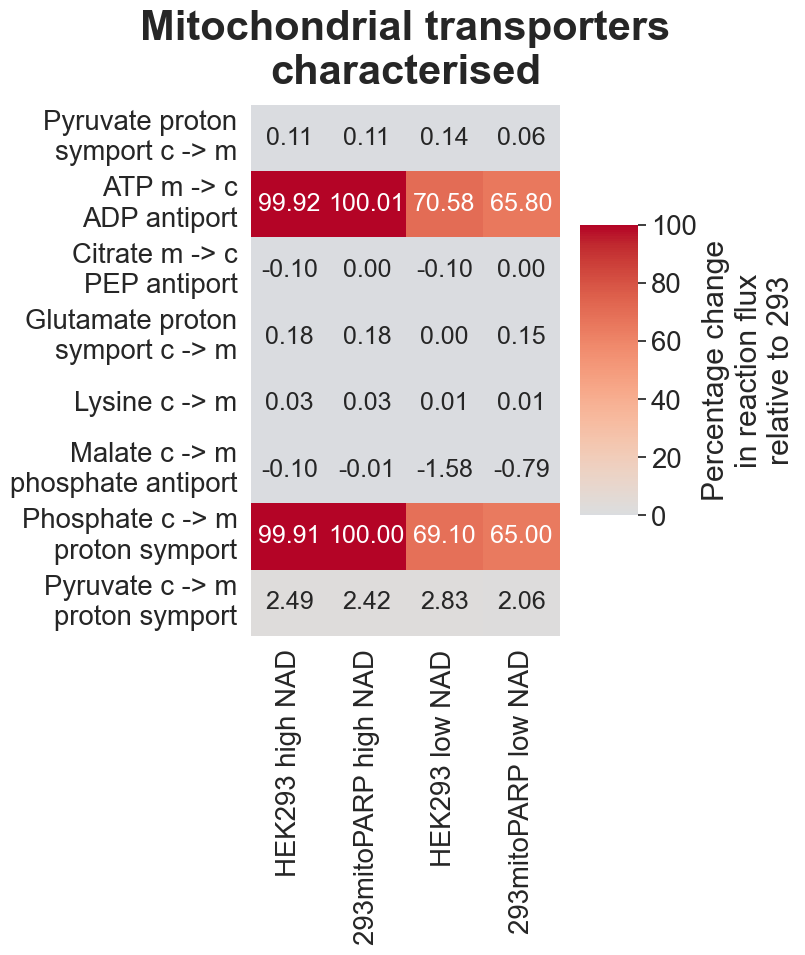

In [69]:
df_sel = df_fl.loc[df_fl.subsystem == path, tags_mito]
df_sel = df_sel[df_sel.loc[:, tags_mito].std(axis=1) >= .01]

limit = 10 * 1
fig, ax = plots.basic_heatmap(
    df_sel,
    annot=True,
    annot_kws = {
        'fontsize': 'small'
    },
    norm = get_norm(df_sel),
    size=(8.5, 10.),
    cmap=cmap_shift,
    xrotation = 90,
    yrotation=0,
    cbarlabel = 'Percentage change\nin reaction flux\nrelative to 293',
    font_scale = 1.8,
    labels = print_labels[:],
    cbar_kws = {
        'aspect': 5,
    },
)
ylabels = df_sel.index.map(lambda s: mapping.get(s, f'MISSING {s}'))
ax.set_yticklabels(ylabels)
ax.set_title(
    'Mitochondrial transporters\ncharacterised', 
    fontdict={'fontsize':30, 'fontweight':'bold'}, 
    pad=15
)
pp.tight_layout()